# **Importing library&function**






In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Activation,Dropout,Conv2D, MaxPooling2D,BatchNormalization, Flatten
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.preprocessing import image_dataset_from_directory
from sklearn.preprocessing import OneHotEncoder
import numpy as np
import pandas as pd
import shutil
import time
import cv2 as cv2
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import os
import seaborn as sns
sns.set_style('darkgrid')
from PIL import Image
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, roc_auc_score, mean_squared_error, auc
from IPython.core.display import display, HTML
import numpy as np
import time
import os
from google.colab import drive
import itertools

!pip install split_folders
import splitfolders

!pip install scikit-learn

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!ls /content/drive/MyDrive/ColabNotebooks/FinalProject/Dataset/types/
loc = "/content/drive/MyDrive/ColabNotebooks/FinalProject/Dataset/types/"

cataract  diabetic_retinopathy	glaucoma  normal


In [110]:
splitfolders.ratio(loc,output = "output1",ratio = (0.80,0.10,0.10))
for dirpath,dirname,filename in os.walk("./output1"):
  print(f"There are {len(dirname)} directories and {len(filename)} images in '{dirpath}'.")

Copying files: 4217 files [00:10, 418.26 files/s]

There are 3 directories and 0 images in './output1'.
There are 4 directories and 0 images in './output1/train'.
There are 0 directories and 934 images in './output1/train/cataract'.
There are 0 directories and 906 images in './output1/train/glaucoma'.
There are 0 directories and 966 images in './output1/train/normal'.
There are 0 directories and 988 images in './output1/train/diabetic_retinopathy'.
There are 4 directories and 0 images in './output1/test'.
There are 0 directories and 105 images in './output1/test/cataract'.
There are 0 directories and 102 images in './output1/test/glaucoma'.
There are 0 directories and 108 images in './output1/test/normal'.
There are 0 directories and 111 images in './output1/test/diabetic_retinopathy'.
There are 4 directories and 0 images in './output1/val'.
There are 0 directories and 154 images in './output1/val/cataract'.
There are 0 directories and 150 images in './output1/val/glaucoma'.
There are 0 directories and 160 images in './output1/val/norm

In [111]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor = "val_loss",patience = 6,
                                             min_delta = 0.0001)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = "val_loss",factor = 0.2,
                                                patience = 4,min_lr = 1e-7)

In [112]:
def predict_labels(model, X_test):
    return model.predict(X_test)

def display_classification_report(y_test, y_pred):
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

def calculate_specificity(y_test, y_pred):
    # tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    # specificity = tn / (tn + fp)
    # print(f"Specificity: {specificity}")
    cm = confusion_matrix(y_test, y_pred)
    specificity = []
    for i in range(cm.shape[0]):
      spec = cm[i, i] / (np.sum(cm[i, :]) - cm[i, i] + np.sum(cm[:, :]) - np.sum(cm[i, :]))
      specificity.append(spec)
    print(f"Specificity: {specificity}")

def plot_loss_curves(history):
  """
  Returns separate loss curves for training and validation metrics.
  """
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # Plot loss
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='training_accuracy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend();

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False):
    # Create the confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]  # normalize
    n_classes = cm.shape[0]  # find the number of classes

    specificity = []  # To store specificity values for each class

    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.Blues)
    fig.colorbar(cax)

    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])

    ax.set(
        title="Confusion Matrix",
        xlabel="Predicted label",
        ylabel="True label",
        xticks=np.arange(n_classes),
        yticks=np.arange(n_classes),
        xticklabels=labels,
        yticklabels=labels
    )

    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()

    plt.xticks(rotation=70, fontsize=text_size)
    plt.yticks(fontsize=text_size)

    threshold = (cm.max() + cm.min()) / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        specificity_val = (cm.sum() - cm[i].sum() - cm[:, j].sum() + cm[i, j]) / (
            cm.sum() - cm[:, j].sum()
        )
        specificity.append(specificity_val)

        if norm:
            plt.text(
                j,
                i,
                f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%,\n {specificity_val*100:.1f}%)",
                #  f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%, Specificity: {specificity_val*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size,
            )
        else:
            plt.text(
                j,
                i,
                f"{cm[i, j]} ( {specificity_val*100:.1f}%)",
                #  f"{cm[i, j]} (Specificity: {specificity_val*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size,
            )

    if savefig:
        fig.savefig("confusion_matrix.png")

    return specificity

def calculate_mse(y_test, y_probs, n_classes):
  y_true_onehot = tf.keras.utils.to_categorical(y_test, n_classes)
  mse = mean_squared_error(y_true_onehot, y_probs)
  print(f"Mean Squared Error: : {mse}")
  return y_true_onehot

def calculate_roc_auc_score(y_test, y_probs):
  auc_roc = roc_auc_score(y_test, y_probs, multi_class='ovr', average=None)
  average_auc_roc = np.mean(auc_roc)
  print(f"The average AUC-ROC is {average_auc_roc}")

# **Batch size: 16**

In [113]:
epoch = 20
batchsize = 16

In [114]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3794 files belonging to 4 classes.
Found 426 files belonging to 4 classes.
Found 627 files belonging to 4 classes.


# **EfficientNetV2B3 Model**

In [115]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


In [116]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
# x = data_aug(inputs)
x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d_9  (None, 1536)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_27 (Dense)            (None, 32)                49184     
                                                                 
 dense_28 (Dense)            (None, 4)                 132       
                                                                 
 activation_6 (Activation)   (None, 4)                 0   

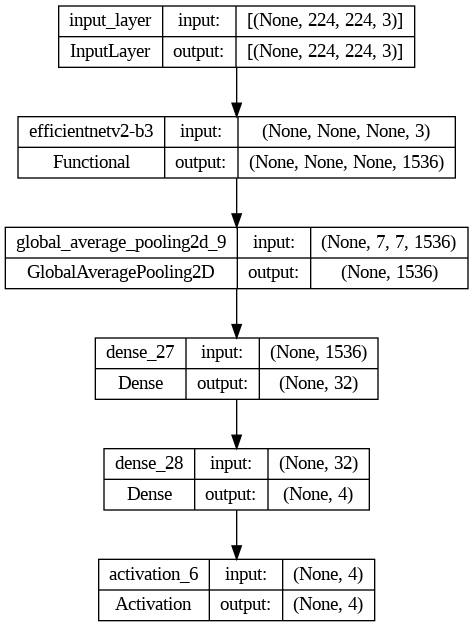

In [117]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [118]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [119]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
238/238 [==============================] - 27s 70ms/step - loss: 0.6039 - accuracy: 0.7675 - val_loss: 0.3500 - val_accuracy: 0.8836 - lr: 0.0010
Epoch 2/20
238/238 [==============================] - 14s 56ms/step - loss: 0.4222 - accuracy: 0.8332 - val_loss: 0.2788 - val_accuracy: 0.9043 - lr: 0.0010
Epoch 3/20
238/238 [==============================] - 14s 57ms/step - loss: 0.3659 - accuracy: 0.8637 - val_loss: 0.2741 - val_accuracy: 0.8963 - lr: 0.0010
Epoch 4/20
238/238 [==============================] - 14s 57ms/step - loss: 0.3288 - accuracy: 0.8701 - val_loss: 0.2406 - val_accuracy: 0.9123 - lr: 0.0010
Epoch 5/20
238/238 [==============================] - 13s 56ms/step - loss: 0.3028 - accuracy: 0.8872 - val_loss: 0.2210 - val_accuracy: 0.9219 - lr: 0.0010
Epoch 6/20
238/238 [==============================] - 14s 56ms/step - loss: 0.2904 - accuracy: 0.8864 - val_loss: 0.1986 - val_accuracy: 0.9234 - lr: 0.0010
Epoch 7/20
238/238 [==============================] - 14s 

EfficientNetV2B3 Evaluation

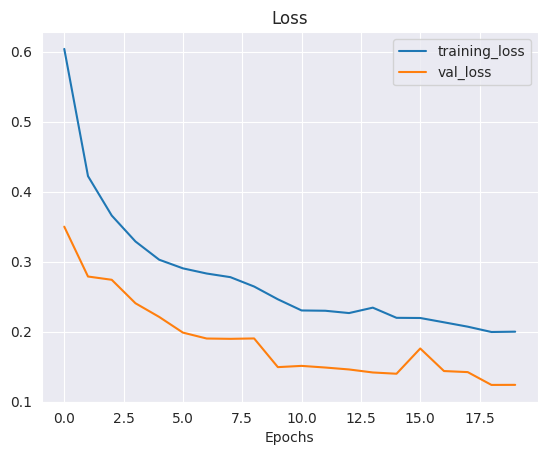

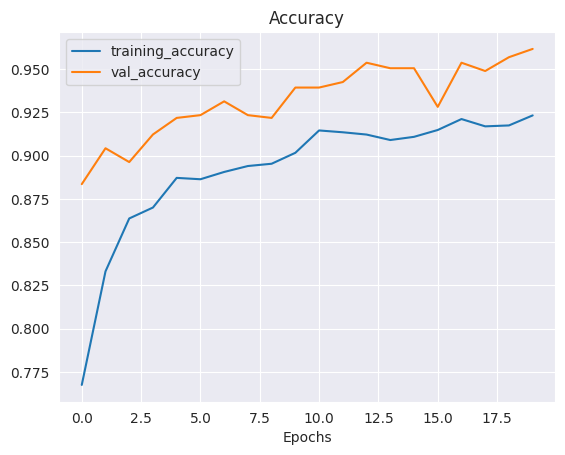

In [120]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


27/27 [==============================] - 1s 43ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.94      0.95       105
           1       1.00      0.97      0.99       111
           2       0.85      0.91      0.88       102
           3       0.91      0.89      0.90       108

    accuracy                           0.93       426
   macro avg       0.93      0.93      0.93       426
weighted avg       0.93      0.93      0.93       426

Specificity: [0.30275229357798167, 0.33962264150943394, 0.27927927927927926, 0.2909090909090909]
Mean Squared Error: : 0.10527481138706207
The average AUC-ROC is 0.9905191406709853


[0.9813664596273292,
 0.6698113207547169,
 0.6845425867507886,
 0.67601246105919,
 0.65527950310559,
 0.9905660377358491,
 0.6498422712933754,
 0.6635514018691588,
 0.6956521739130435,
 0.6792452830188679,
 0.9716088328075709,
 0.6978193146417445,
 0.6677018633540373,
 0.660377358490566,
 0.694006309148265,
 0.9626168224299065]

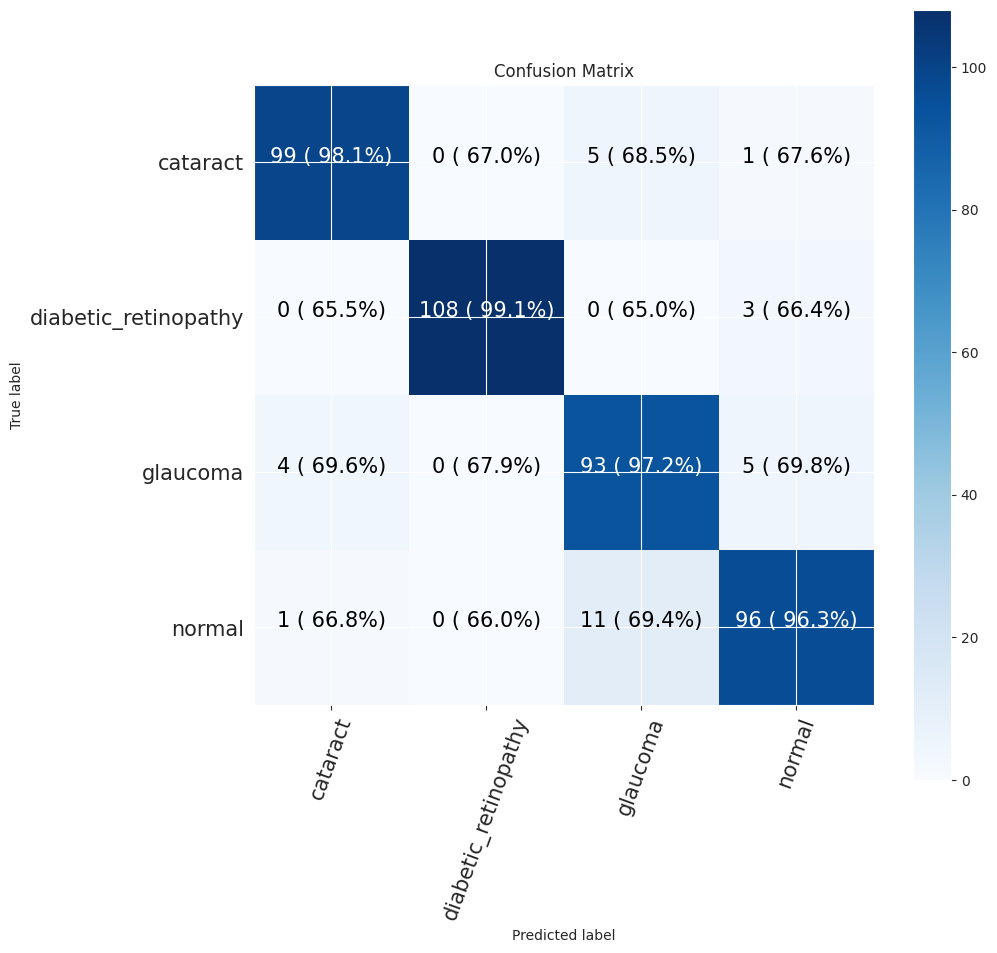

In [121]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


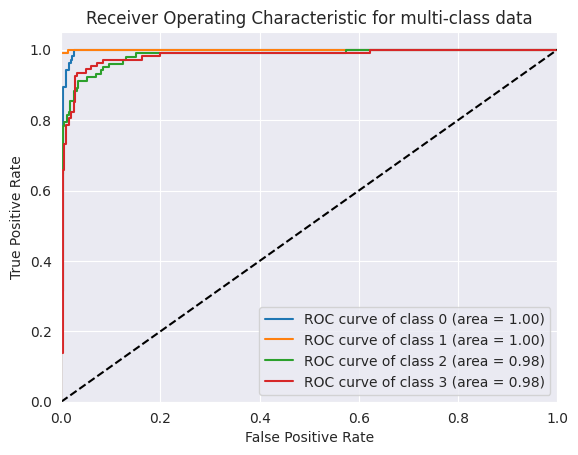

In [122]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [123]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# # Freeze the layers in the base model
# for layer in cnn_model.layers:
#     layer.trainable = False

# rbg = layers.Input(shape=(224, 224, 3))

# rbg = data_aug(rbg)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes


# Display model summary
cnn_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_12 (MaxPooli  (None, 111, 111, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_16 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_13 (MaxPooli  (None, 54, 54, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_17 (Conv2D)          (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_14 (MaxPooli  (None, 26, 26, 128)      

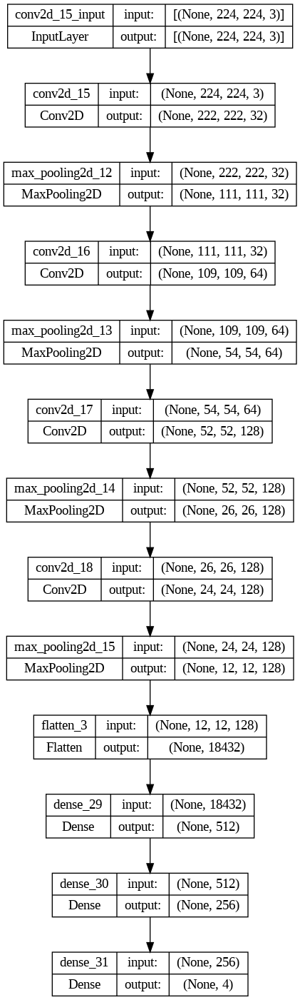

In [124]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [125]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [126]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
238/238 [==============================] - 9s 31ms/step - loss: 1.0343 - accuracy: 0.5988 - val_loss: 0.2846 - val_accuracy: 0.7033 - lr: 0.0010
Epoch 2/20
238/238 [==============================] - 7s 29ms/step - loss: 0.3279 - accuracy: 0.6863 - val_loss: 0.3050 - val_accuracy: 0.7018 - lr: 0.0010
Epoch 3/20
238/238 [==============================] - 7s 29ms/step - loss: 0.2950 - accuracy: 0.7066 - val_loss: 0.2742 - val_accuracy: 0.7129 - lr: 0.0010
Epoch 4/20
238/238 [==============================] - 7s 29ms/step - loss: 0.2971 - accuracy: 0.7095 - val_loss: 0.2641 - val_accuracy: 0.7528 - lr: 0.0010
Epoch 5/20
238/238 [==============================] - 7s 29ms/step - loss: 0.2790 - accuracy: 0.7243 - val_loss: 0.2554 - val_accuracy: 0.7448 - lr: 0.0010
Epoch 6/20
238/238 [==============================] - 7s 29ms/step - loss: 0.2657 - accuracy: 0.7396 - val_loss: 0.2560 - val_accuracy: 0.7241 - lr: 0.0010
Epoch 7/20
238/238 [==============================] - 7s 29ms/st

CNN Evaluation

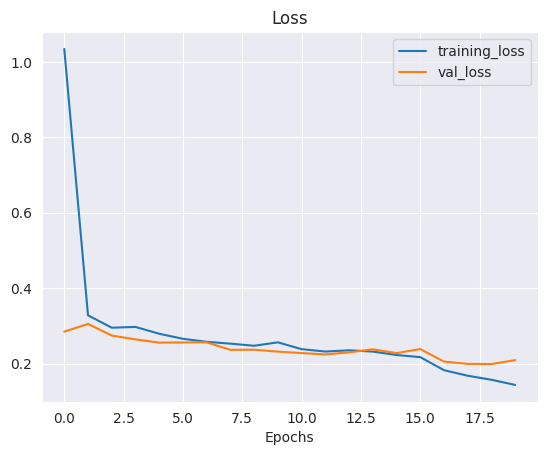

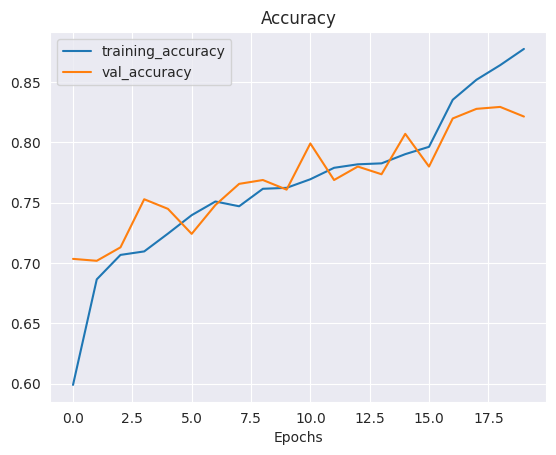

In [127]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


27/27 [==============================] - 0s 9ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.66      0.44      0.53       105
           1       0.98      0.97      0.98       111
           2       0.56      0.63      0.59       102
           3       0.72      0.87      0.79       108

    accuracy                           0.73       426
   macro avg       0.73      0.73      0.72       426
weighted avg       0.73      0.73      0.72       426

Specificity: [0.12105263157894737, 0.33962264150943394, 0.17679558011049723, 0.28313253012048195]
Mean Squared Error: : 0.1327040195465088
The average AUC-ROC is 0.889345572457204


[0.8342696629213483,
 0.6677215189873418,
 0.7909967845659164,
 0.7084745762711865,
 0.6910112359550562,
 0.990506329113924,
 0.6495176848874598,
 0.6237288135593221,
 0.7696629213483146,
 0.6772151898734177,
 0.8778135048231511,
 0.7152542372881356,
 0.7050561797752809,
 0.6645569620253164,
 0.6816720257234726,
 0.9525423728813559]

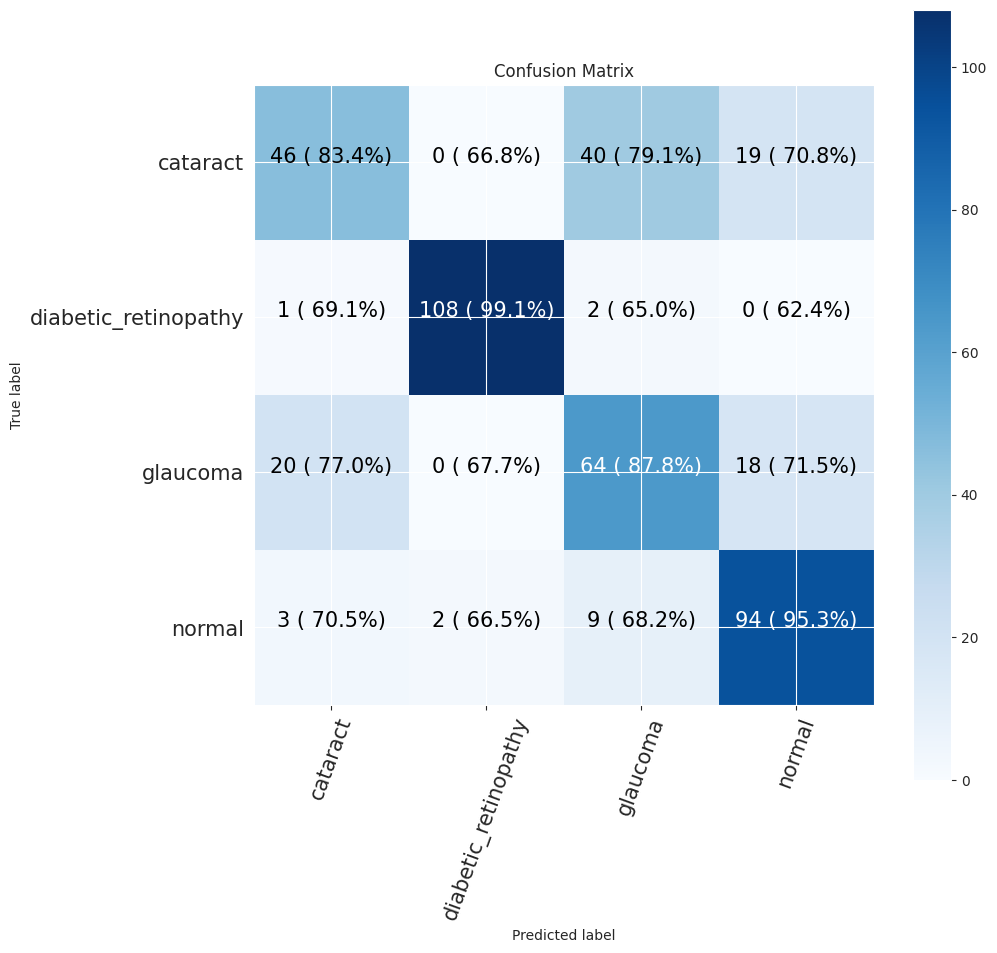

In [128]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


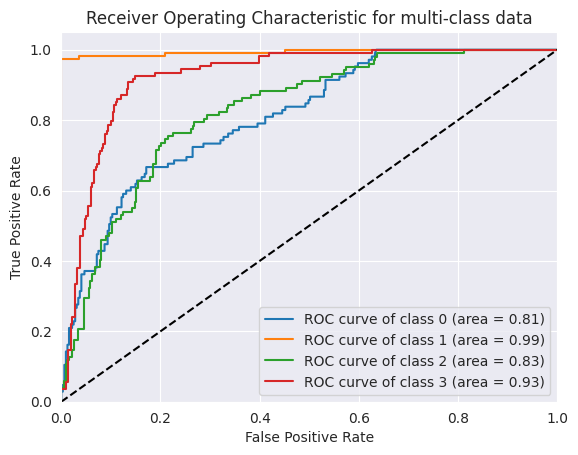

In [129]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [130]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [131]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

input = layers.Input(shape=(224, 224, 3))

conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_15 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_19 (Conv2D)          (None, 224, 224, 3)       84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
 0 (GlobalAveragePooling2D)                                      
                                                                 
 dense_32 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_33 (Dense)            (None, 4)                 4100      
                                                          

In [132]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

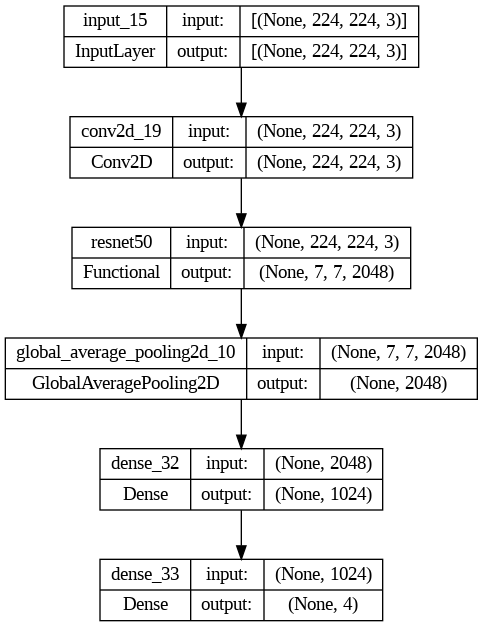

In [133]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [134]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [135]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
238/238 [==============================] - 39s 147ms/step - loss: 0.2706 - accuracy: 0.7746 - val_loss: 0.1455 - val_accuracy: 0.8931 - lr: 0.0010
Epoch 2/20
238/238 [==============================] - 33s 139ms/step - loss: 0.1611 - accuracy: 0.8745 - val_loss: 0.1621 - val_accuracy: 0.8628 - lr: 0.0010
Epoch 3/20
238/238 [==============================] - 33s 139ms/step - loss: 0.1349 - accuracy: 0.8940 - val_loss: 0.1389 - val_accuracy: 0.8915 - lr: 0.0010
Epoch 4/20
238/238 [==============================] - 33s 139ms/step - loss: 0.1263 - accuracy: 0.9009 - val_loss: 0.0944 - val_accuracy: 0.9266 - lr: 0.0010
Epoch 5/20
238/238 [==============================] - 33s 139ms/step - loss: 0.1097 - accuracy: 0.9120 - val_loss: 0.0829 - val_accuracy: 0.9362 - lr: 0.0010
Epoch 6/20
238/238 [==============================] - 33s 139ms/step - loss: 0.1018 - accuracy: 0.9188 - val_loss: 0.0898 - val_accuracy: 0.9378 - lr: 0.0010
Epoch 7/20
238/238 [==============================] 

ResNet50 Evaluation

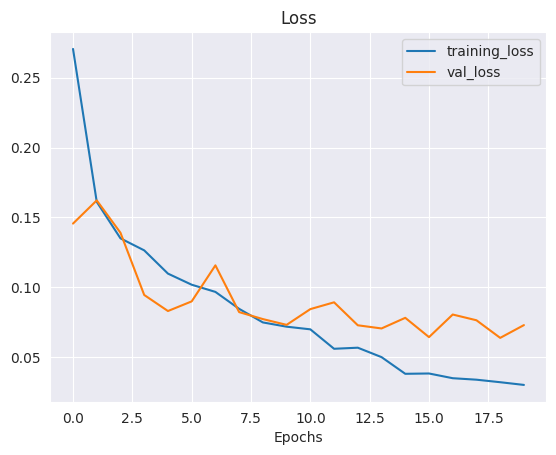

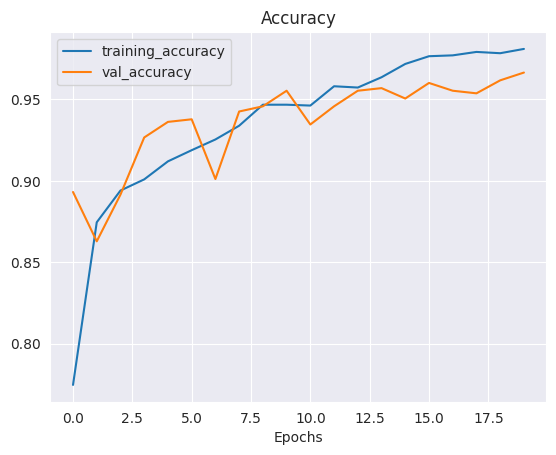

In [136]:
plot_loss_curves(resnet50_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


27/27 [==============================] - 1s 49ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.96      0.94       105
           1       1.00      0.97      0.99       111
           2       0.88      0.89      0.88       102
           3       0.90      0.86      0.88       108

    accuracy                           0.92       426
   macro avg       0.92      0.92      0.92       426
weighted avg       0.92      0.92      0.92       426

Specificity: [0.31076923076923074, 0.33962264150943394, 0.2716417910447761, 0.27927927927927926]
Mean Squared Error: : 0.10416072607040405
The average AUC-ROC is 0.9805133210630542


[0.9873015873015873,
 0.6698113207547169,
 0.6832298136645962,
 0.6780185758513931,
 0.6476190476190476,
 0.9905660377358491,
 0.6583850931677019,
 0.6625386996904025,
 0.6888888888888889,
 0.6792452830188679,
 0.9658385093167702,
 0.7058823529411765,
 0.6761904761904762,
 0.660377358490566,
 0.6925465838509317,
 0.9535603715170279]

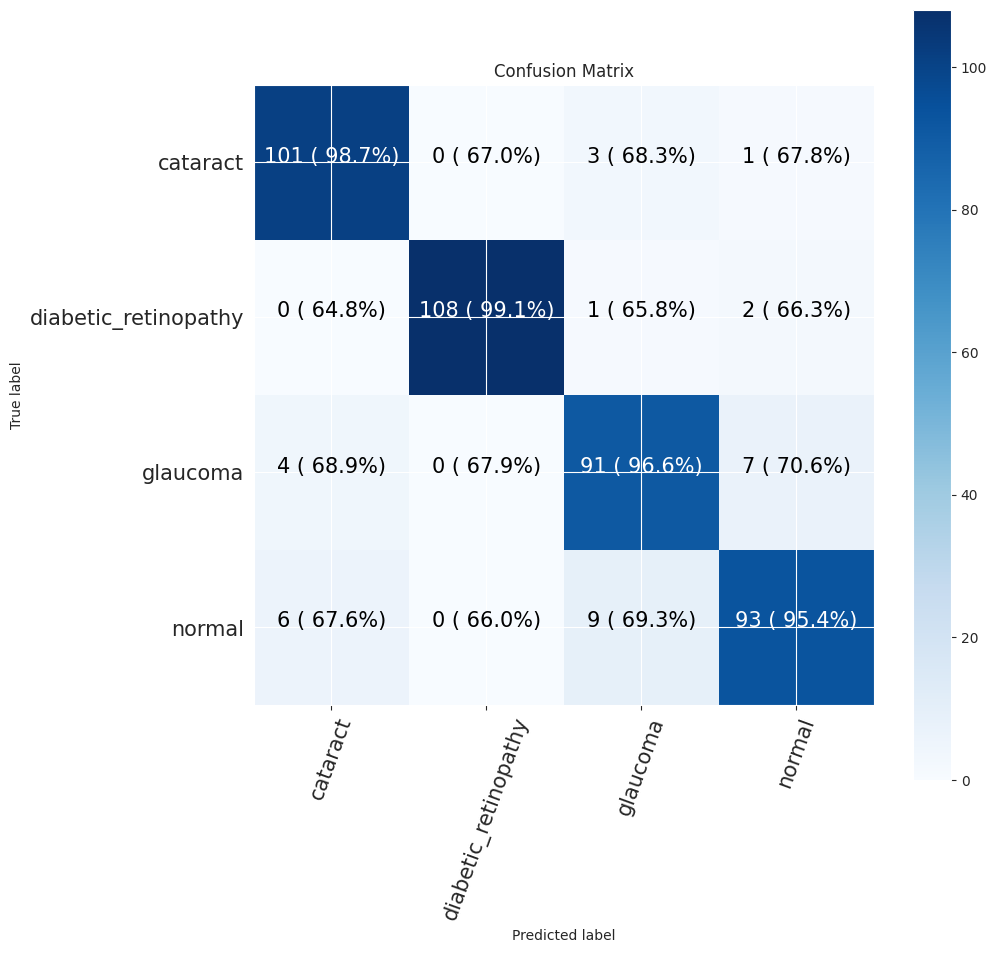

In [137]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


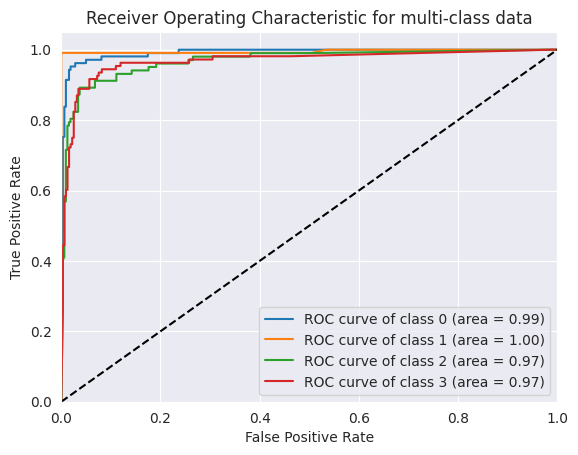

In [138]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [139]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [140]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



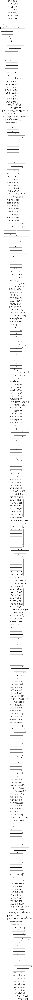

In [141]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [142]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
# x = data_aug(inputs)
x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
 1 (GlobalAveragePooling2D)                                      
                                                                 
 dense_34 (Dense)            (None, 32)                65568     
                                                                 
 dense_35 (Dense)            (None, 4)                 132       
                                                                 
 activation_7 (Activation)   (None, 4)                 0  

In [143]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [144]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
238/238 [==============================] - 31s 107ms/step - loss: 0.5317 - accuracy: 0.7905 - val_loss: 0.3412 - val_accuracy: 0.8724 - lr: 0.0010
Epoch 2/20
238/238 [==============================] - 24s 101ms/step - loss: 0.3410 - accuracy: 0.8716 - val_loss: 0.2403 - val_accuracy: 0.9075 - lr: 0.0010
Epoch 3/20
238/238 [==============================] - 24s 99ms/step - loss: 0.2793 - accuracy: 0.8930 - val_loss: 0.2240 - val_accuracy: 0.9043 - lr: 0.0010
Epoch 4/20
238/238 [==============================] - 24s 99ms/step - loss: 0.2491 - accuracy: 0.9088 - val_loss: 0.2132 - val_accuracy: 0.9187 - lr: 0.0010
Epoch 5/20
238/238 [==============================] - 24s 99ms/step - loss: 0.2157 - accuracy: 0.9162 - val_loss: 0.1764 - val_accuracy: 0.9394 - lr: 0.0010
Epoch 6/20
238/238 [==============================] - 24s 100ms/step - loss: 0.1858 - accuracy: 0.9315 - val_loss: 0.2266 - val_accuracy: 0.9155 - lr: 0.0010
Epoch 7/20
238/238 [==============================] - 2

ResNet50 Evaluation

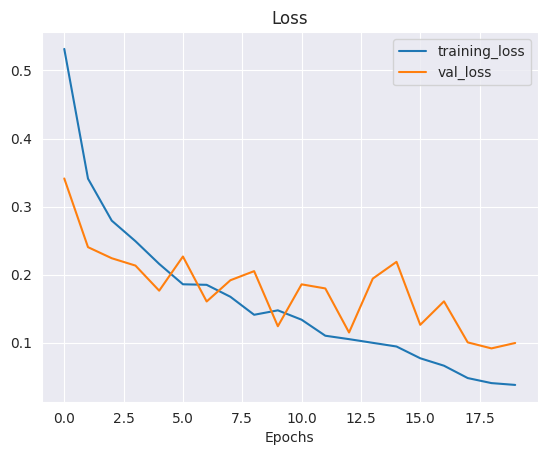

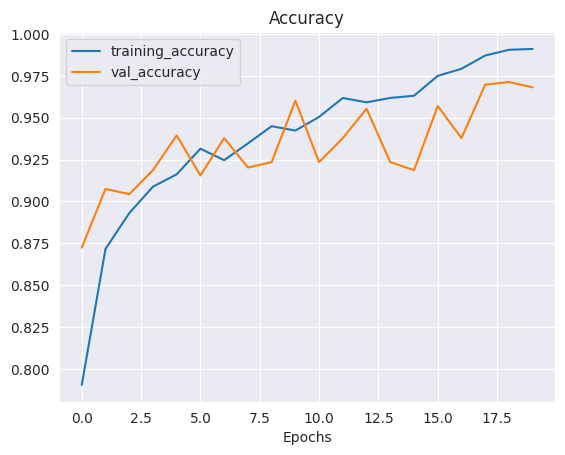

In [145]:
plot_loss_curves(resnet101_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


27/27 [==============================] - 2s 81ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.89      0.93       105
           1       1.00      0.97      0.99       111
           2       0.80      0.95      0.87       102
           3       0.92      0.86      0.89       108

    accuracy                           0.92       426
   macro avg       0.92      0.92      0.92       426
weighted avg       0.92      0.92      0.92       426

Specificity: [0.27927927927927926, 0.33962264150943394, 0.2948328267477204, 0.27927927927927926]
Mean Squared Error: : 0.10640862584114075
The average AUC-ROC is 0.9880258835510112


[0.9636363636363636,
 0.6698113207547169,
 0.6950819672131148,
 0.676923076923077,
 0.6636363636363637,
 0.9905660377358491,
 0.6360655737704918,
 0.6676923076923077,
 0.6909090909090909,
 0.6792452830188679,
 0.9836065573770492,
 0.7015384615384616,
 0.6818181818181818,
 0.660377358490566,
 0.6852459016393443,
 0.9538461538461539]

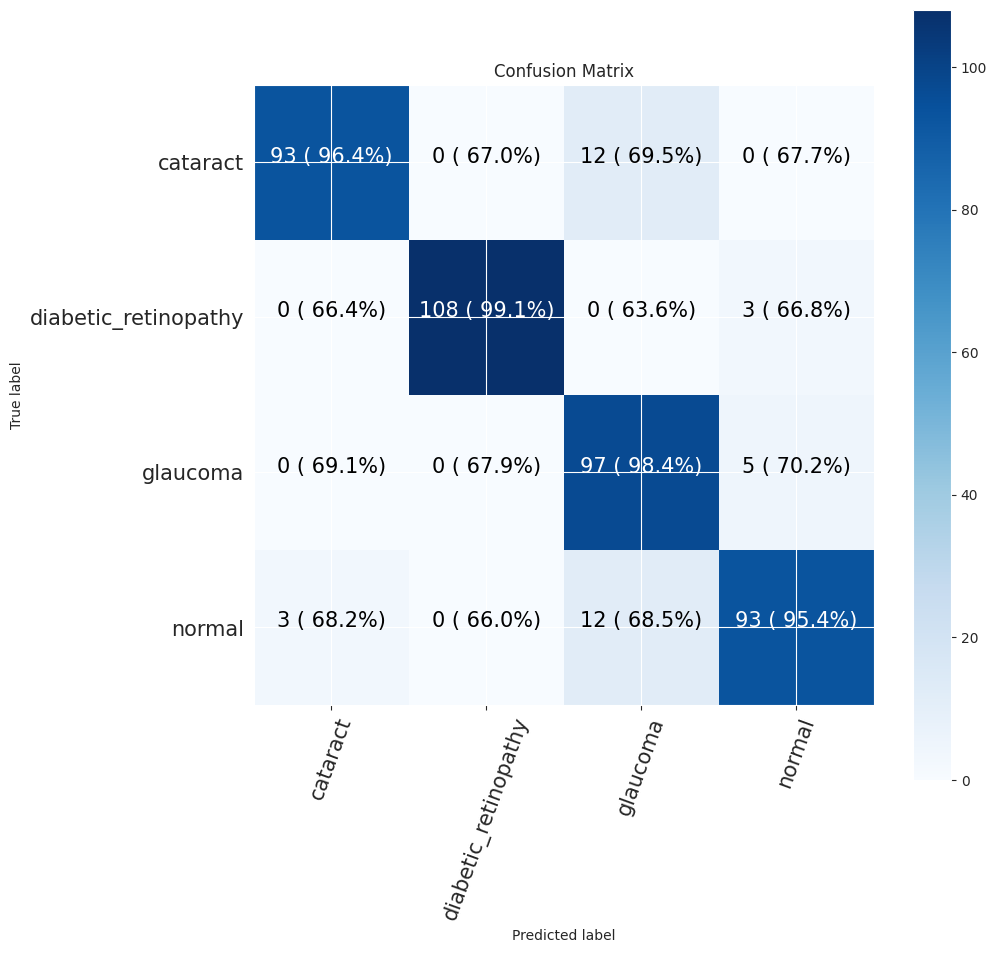

In [146]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


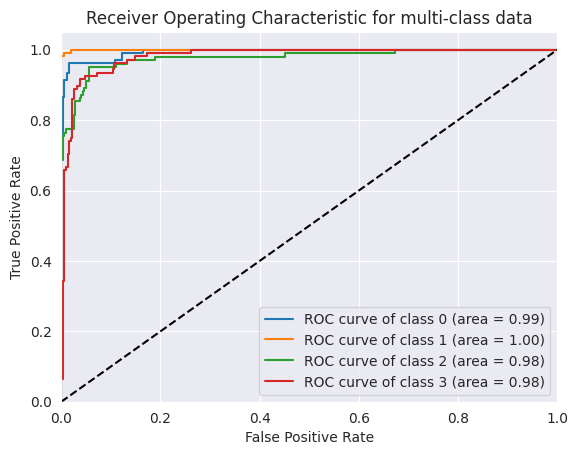

In [147]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **Batch size: 32**

In [148]:
epoch = 20
batchsize = 32

In [149]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3794 files belonging to 4 classes.
Found 426 files belonging to 4 classes.
Found 627 files belonging to 4 classes.


# **EfficientNetV2B3 Model**

In [150]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


In [151]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
# x = data_aug(inputs)
x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d_1  (None, 1536)              0         
 2 (GlobalAveragePooling2D)                                      
                                                                 
 dense_36 (Dense)            (None, 32)                49184     
                                                                 
 dense_37 (Dense)            (None, 4)                 132       
                                                                 
 activation_8 (Activation)   (None, 4)                 0  

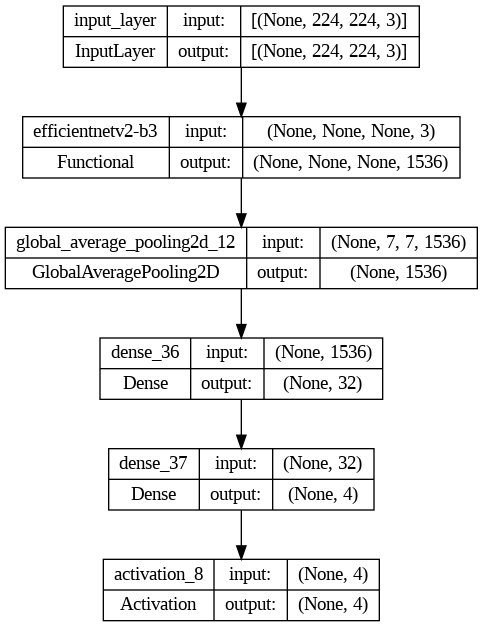

In [152]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [153]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [154]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
119/119 [==============================] - 28s 134ms/step - loss: 0.6108 - accuracy: 0.7517 - val_loss: 0.3538 - val_accuracy: 0.8836 - lr: 0.0010
Epoch 2/20
119/119 [==============================] - 12s 103ms/step - loss: 0.4285 - accuracy: 0.8358 - val_loss: 0.3123 - val_accuracy: 0.8868 - lr: 0.0010
Epoch 3/20
119/119 [==============================] - 13s 104ms/step - loss: 0.3776 - accuracy: 0.8537 - val_loss: 0.2880 - val_accuracy: 0.8868 - lr: 0.0010
Epoch 4/20
119/119 [==============================] - 12s 103ms/step - loss: 0.3403 - accuracy: 0.8693 - val_loss: 0.2296 - val_accuracy: 0.9155 - lr: 0.0010
Epoch 5/20
119/119 [==============================] - 12s 102ms/step - loss: 0.3203 - accuracy: 0.8735 - val_loss: 0.2088 - val_accuracy: 0.9298 - lr: 0.0010
Epoch 6/20
119/119 [==============================] - 12s 102ms/step - loss: 0.3050 - accuracy: 0.8867 - val_loss: 0.1976 - val_accuracy: 0.9314 - lr: 0.0010
Epoch 7/20
119/119 [==============================] 

EfficientNetV2B3 Evaluation

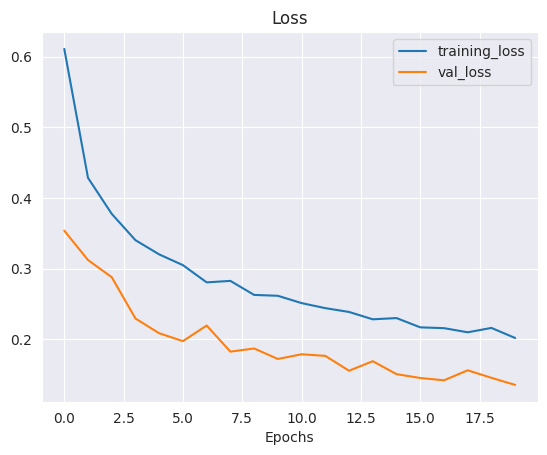

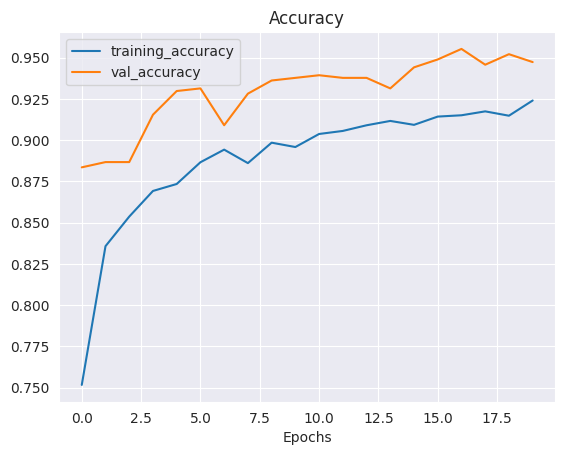

In [155]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 1s 79ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       105
           1       0.99      0.97      0.98       111
           2       0.88      0.85      0.87       102
           3       0.86      0.89      0.88       108

    accuracy                           0.92       426
   macro avg       0.92      0.92      0.92       426
weighted avg       0.92      0.92      0.92       426

Specificity: [0.3148148148148148, 0.33962264150943394, 0.25663716814159293, 0.2909090909090909]
Mean Squared Error: : 0.10551580786705017
The average AUC-ROC is 0.9908918670007796


[0.9905956112852664,
 0.668769716088328,
 0.6850152905198776,
 0.6698412698412698,
 0.6520376175548589,
 0.9905362776025236,
 0.6605504587155964,
 0.6571428571428571,
 0.6927899686520376,
 0.6782334384858044,
 0.9541284403669725,
 0.7111111111111111,
 0.664576802507837,
 0.6624605678233438,
 0.7003058103975535,
 0.9619047619047619]

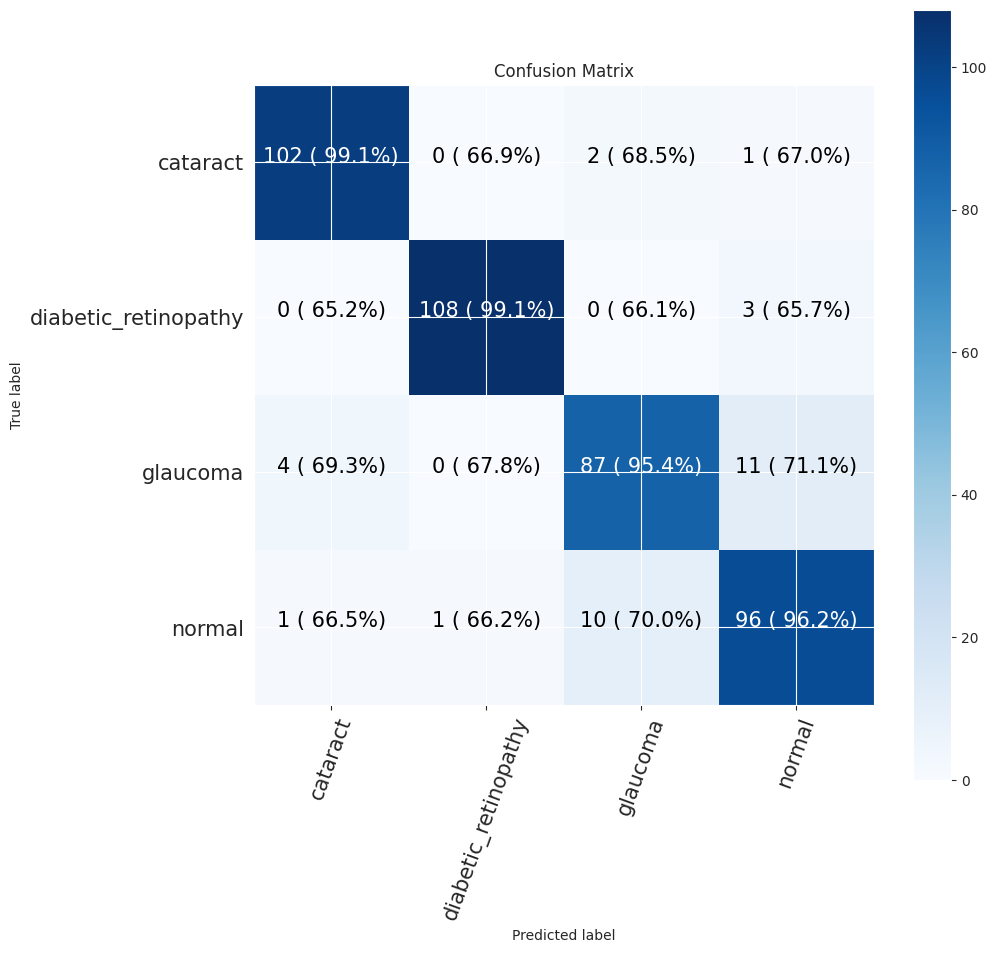

In [156]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


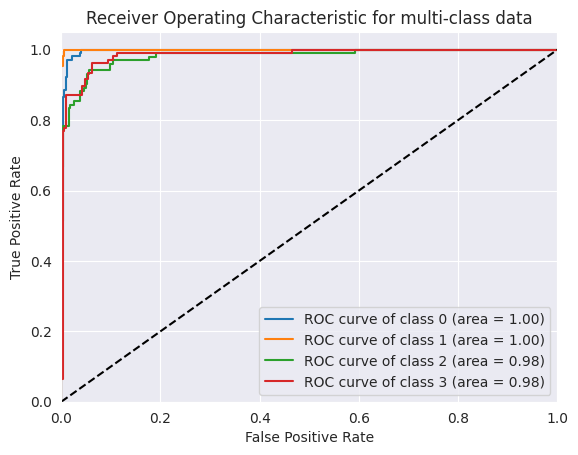

In [157]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [158]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# # Freeze the layers in the base model
# for layer in cnn_model.layers:
#     layer.trainable = False

# rbg = layers.Input(shape=(224, 224, 3))

# rbg = data_aug(rbg)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes


# Display model summary
cnn_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_16 (MaxPooli  (None, 111, 111, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_21 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_17 (MaxPooli  (None, 54, 54, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_22 (Conv2D)          (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_18 (MaxPooli  (None, 26, 26, 128)      

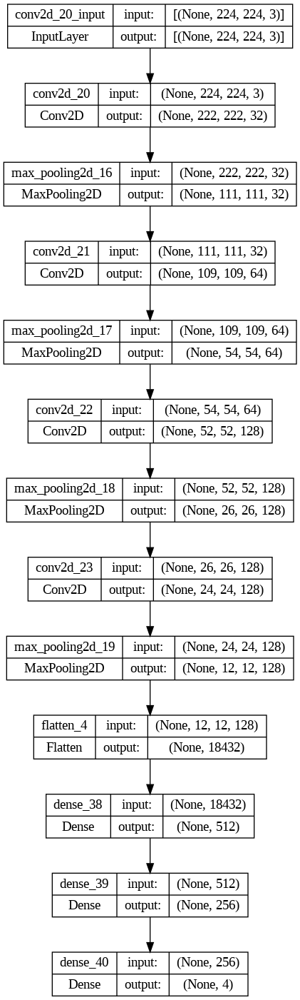

In [159]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [160]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [161]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
119/119 [==============================] - 9s 57ms/step - loss: 0.6535 - accuracy: 0.6191 - val_loss: 0.2308 - val_accuracy: 0.8038 - lr: 0.0010
Epoch 2/20
119/119 [==============================] - 6s 52ms/step - loss: 0.2351 - accuracy: 0.8013 - val_loss: 0.1971 - val_accuracy: 0.8293 - lr: 0.0010
Epoch 3/20
119/119 [==============================] - 6s 52ms/step - loss: 0.2089 - accuracy: 0.8187 - val_loss: 0.1784 - val_accuracy: 0.8628 - lr: 0.0010
Epoch 4/20
119/119 [==============================] - 6s 52ms/step - loss: 0.2027 - accuracy: 0.8271 - val_loss: 0.1898 - val_accuracy: 0.8389 - lr: 0.0010
Epoch 5/20
119/119 [==============================] - 6s 52ms/step - loss: 0.1932 - accuracy: 0.8419 - val_loss: 0.1868 - val_accuracy: 0.8405 - lr: 0.0010
Epoch 6/20
119/119 [==============================] - 6s 52ms/step - loss: 0.1678 - accuracy: 0.8571 - val_loss: 0.1746 - val_accuracy: 0.8485 - lr: 0.0010
Epoch 7/20
119/119 [==============================] - 6s 52ms/st

CNN Evaluation

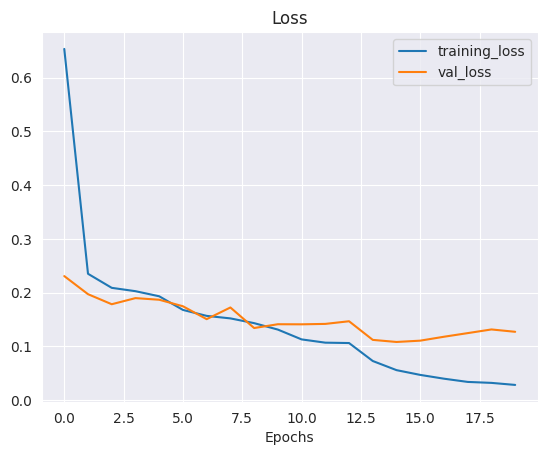

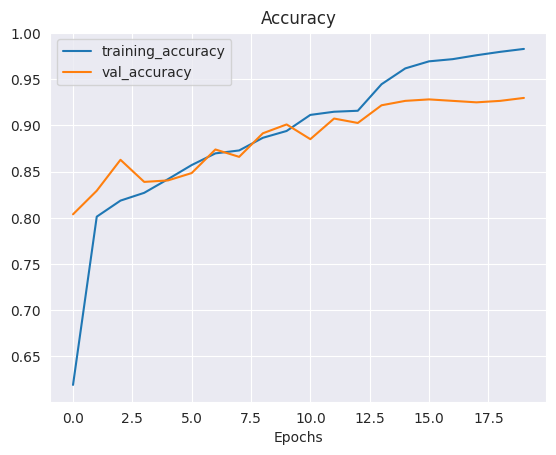

In [162]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 0s 17ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.85      0.85       105
           1       1.00      0.99      1.00       111
           2       0.75      0.77      0.76       102
           3       0.80      0.78      0.79       108

    accuracy                           0.85       426
   macro avg       0.85      0.85      0.85       426
weighted avg       0.85      0.85      0.85       426

Specificity: [0.26409495548961426, 0.34810126582278483, 0.2276657060518732, 0.24561403508771928]
Mean Squared Error: : 0.1134585440158844
The average AUC-ROC is 0.9553910867819176


[0.9501557632398754,
 0.6677215189873418,
 0.7,
 0.6947040498442367,
 0.6542056074766355,
 0.9968354430379747,
 0.65625,
 0.6542056074766355,
 0.7102803738317757,
 0.6772151898734177,
 0.928125,
 0.7258566978193146,
 0.6853582554517134,
 0.6582278481012658,
 0.715625,
 0.9252336448598131]

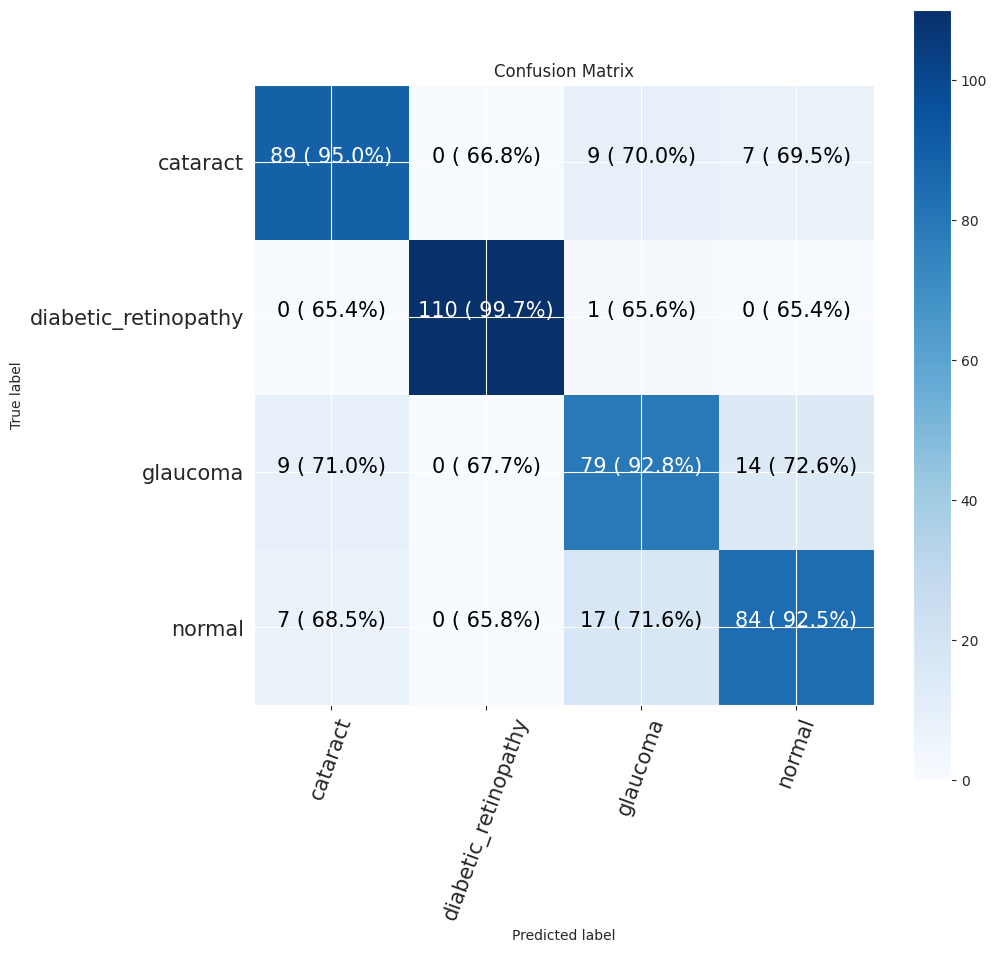

In [163]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


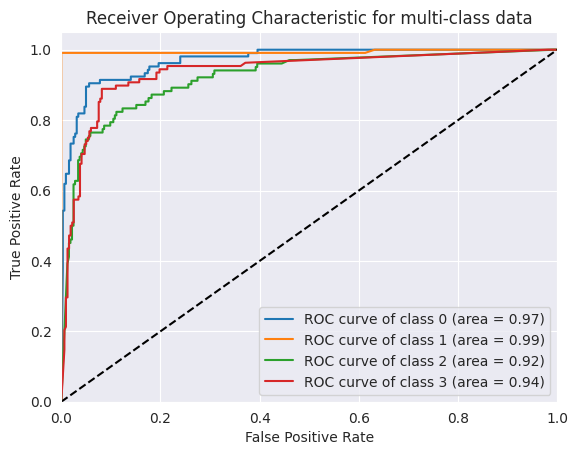

In [164]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [165]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [166]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

input = layers.Input(shape=(224, 224, 3))

conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


Model: "model_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_19 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_24 (Conv2D)          (None, 224, 224, 3)       84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
 3 (GlobalAveragePooling2D)                                      
                                                                 
 dense_41 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_42 (Dense)            (None, 4)                 4100      
                                                          

In [167]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

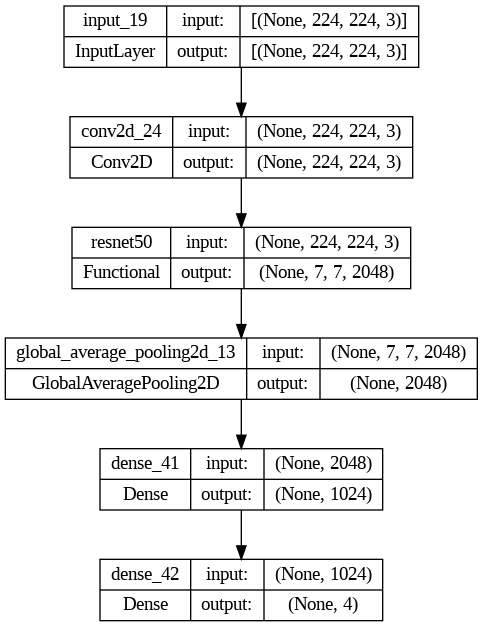

In [168]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [169]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [170]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
119/119 [==============================] - 38s 288ms/step - loss: 0.2865 - accuracy: 0.7818 - val_loss: 0.1599 - val_accuracy: 0.8836 - lr: 0.0010
Epoch 2/20
119/119 [==============================] - 32s 266ms/step - loss: 0.1602 - accuracy: 0.8785 - val_loss: 0.1624 - val_accuracy: 0.8756 - lr: 0.0010
Epoch 3/20
119/119 [==============================] - 32s 266ms/step - loss: 0.1301 - accuracy: 0.8959 - val_loss: 0.1049 - val_accuracy: 0.9282 - lr: 0.0010
Epoch 4/20
119/119 [==============================] - 32s 266ms/step - loss: 0.1092 - accuracy: 0.9159 - val_loss: 0.0822 - val_accuracy: 0.9378 - lr: 0.0010
Epoch 5/20
119/119 [==============================] - 32s 266ms/step - loss: 0.0983 - accuracy: 0.9238 - val_loss: 0.0779 - val_accuracy: 0.9553 - lr: 0.0010
Epoch 6/20
119/119 [==============================] - 32s 266ms/step - loss: 0.0790 - accuracy: 0.9428 - val_loss: 0.0704 - val_accuracy: 0.9537 - lr: 0.0010
Epoch 7/20
119/119 [==============================] 

ResNet50 Evaluation

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 1s 94ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.96      0.94       105
           1       1.00      0.97      0.99       111
           2       0.93      0.78      0.85       102
           3       0.82      0.93      0.87       108

    accuracy                           0.91       426
   macro avg       0.92      0.91      0.91       426
weighted avg       0.92      0.91      0.91       426

Specificity: [0.31076923076923074, 0.33962264150943394, 0.23121387283236994, 0.3067484662576687]
Mean Squared Error: : 0.10482417792081833
The average AUC-ROC is 0.9867673418378444


[0.9873417721518988,
 0.6698113207547169,
 0.6970588235294117,
 0.6611842105263158,
 0.6487341772151899,
 0.9905660377358491,
 0.6735294117647059,
 0.6447368421052632,
 0.6930379746835443,
 0.6792452830188679,
 0.9352941176470588,
 0.7203947368421053,
 0.6708860759493671,
 0.660377358490566,
 0.6941176470588235,
 0.9736842105263158]

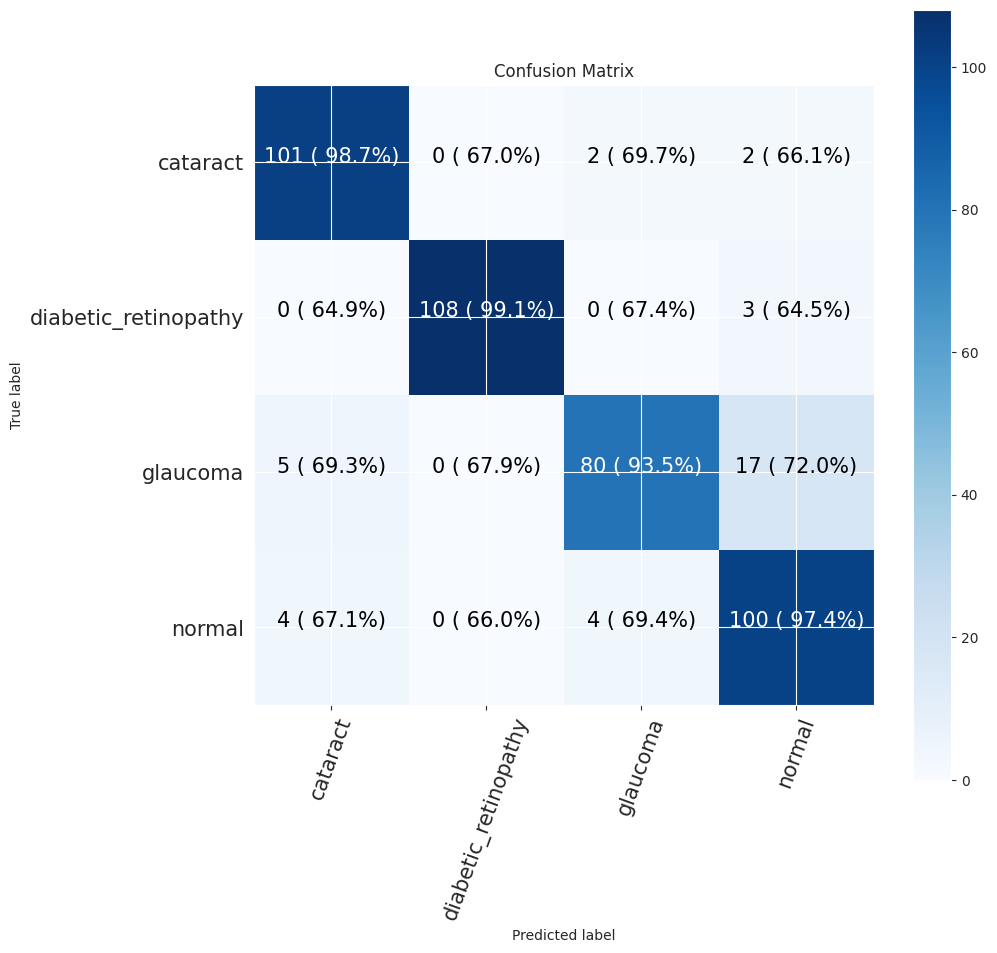

In [171]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


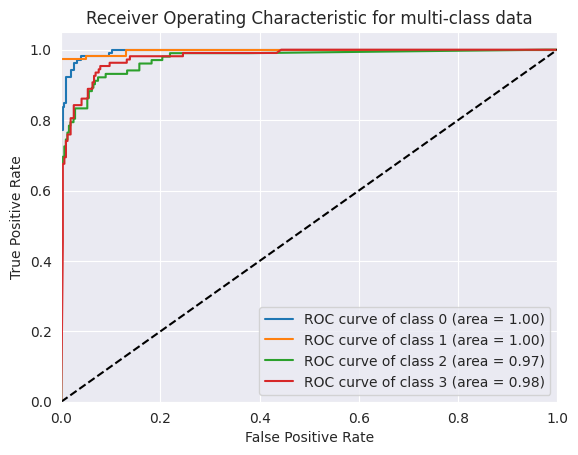

In [172]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [173]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [174]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



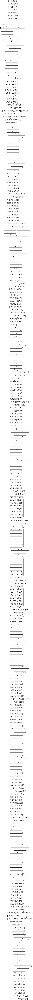

In [175]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [176]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
# x = data_aug(inputs)
x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
 4 (GlobalAveragePooling2D)                                      
                                                                 
 dense_43 (Dense)            (None, 32)                65568     
                                                                 
 dense_44 (Dense)            (None, 4)                 132       
                                                                 
 activation_9 (Activation)   (None, 4)                 0  

In [177]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [178]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
119/119 [==============================] - 32s 206ms/step - loss: 0.5939 - accuracy: 0.7609 - val_loss: 0.3995 - val_accuracy: 0.8740 - lr: 0.0010
Epoch 2/20
119/119 [==============================] - 23s 195ms/step - loss: 0.3691 - accuracy: 0.8619 - val_loss: 0.3269 - val_accuracy: 0.8804 - lr: 0.0010
Epoch 3/20
119/119 [==============================] - 23s 190ms/step - loss: 0.3013 - accuracy: 0.8872 - val_loss: 0.2639 - val_accuracy: 0.8979 - lr: 0.0010
Epoch 4/20
119/119 [==============================] - 23s 188ms/step - loss: 0.2574 - accuracy: 0.9012 - val_loss: 0.2359 - val_accuracy: 0.9203 - lr: 0.0010
Epoch 5/20
119/119 [==============================] - 23s 190ms/step - loss: 0.2406 - accuracy: 0.9106 - val_loss: 0.2146 - val_accuracy: 0.9266 - lr: 0.0010
Epoch 6/20
119/119 [==============================] - 23s 191ms/step - loss: 0.2240 - accuracy: 0.9151 - val_loss: 0.2155 - val_accuracy: 0.9139 - lr: 0.0010
Epoch 7/20
119/119 [==============================] 

ResNet50 Evaluation

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 2s 159ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.90      0.93       105
           1       0.99      0.98      0.99       111
           2       0.79      0.91      0.85       102
           3       0.89      0.83      0.86       108

    accuracy                           0.91       426
   macro avg       0.91      0.91      0.91       426
weighted avg       0.91      0.91      0.91       426

Specificity: [0.28313253012048195, 0.3438485804416404, 0.27927927927927926, 0.26785714285714285]
Mean Squared Error: : 0.10678686201572418
The average AUC-ROC is 0.9882227386317756


[0.9665653495440729,
 0.6677215189873418,
 0.6915584415584416,
 0.68,
 0.662613981762918,
 0.9936708860759493,
 0.6396103896103896,
 0.6646153846153846,
 0.6930091185410334,
 0.6772151898734177,
 0.9707792207792207,
 0.7107692307692308,
 0.6778115501519757,
 0.6613924050632911,
 0.698051948051948,
 0.9446153846153846]

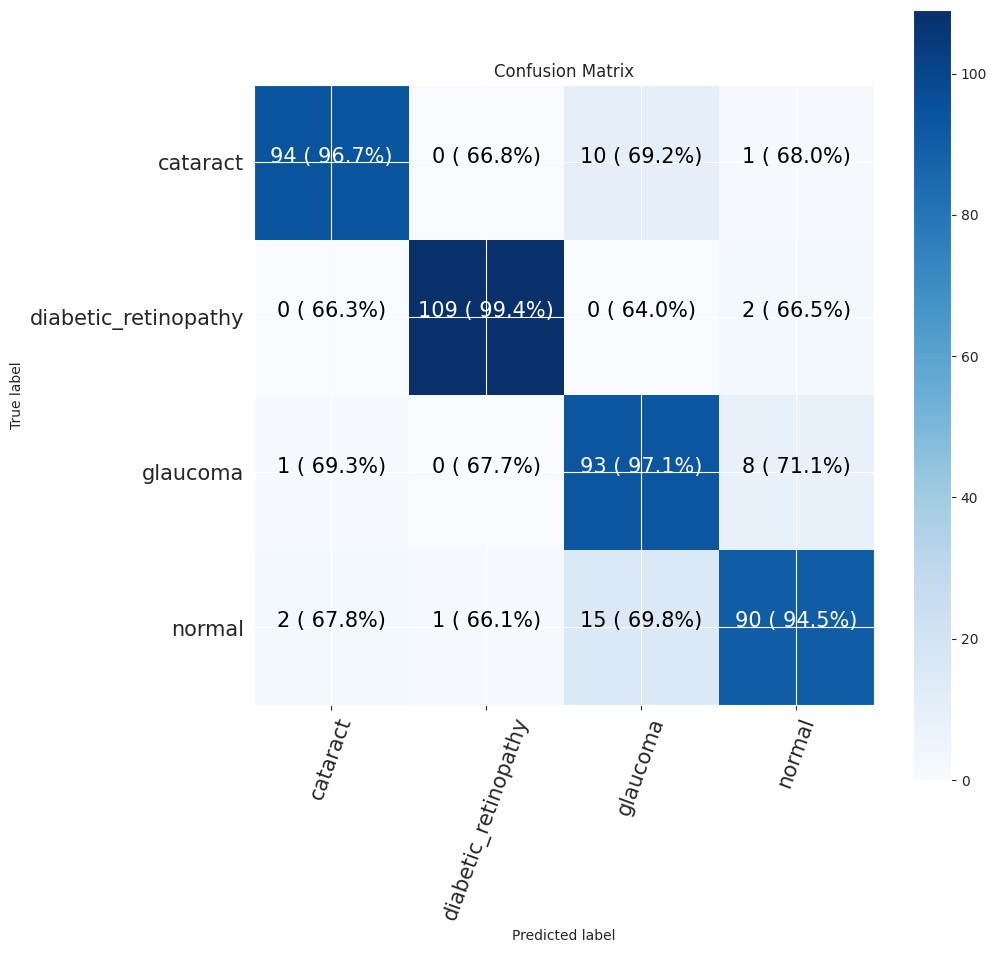

In [179]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


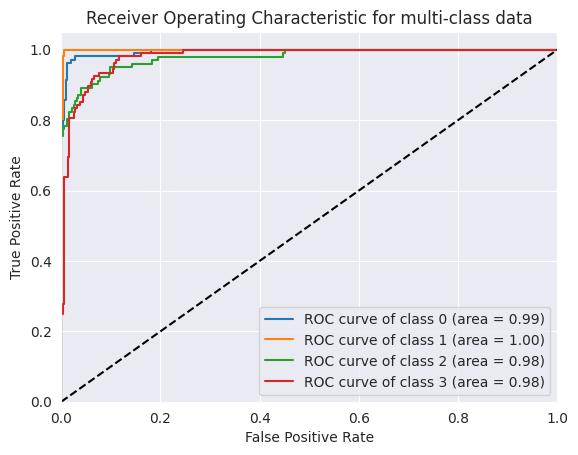

In [180]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **Batch size: 64**

In [181]:
epoch = 20
batchsize = 64

In [182]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3794 files belonging to 4 classes.
Found 426 files belonging to 4 classes.
Found 627 files belonging to 4 classes.


# **EfficientNetV2B3 Model**

In [183]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


In [184]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
# x = data_aug(inputs)
x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d_1  (None, 1536)              0         
 5 (GlobalAveragePooling2D)                                      
                                                                 
 dense_45 (Dense)            (None, 32)                49184     
                                                                 
 dense_46 (Dense)            (None, 4)                 132       
                                                                 
 activation_10 (Activation)  (None, 4)                 0  

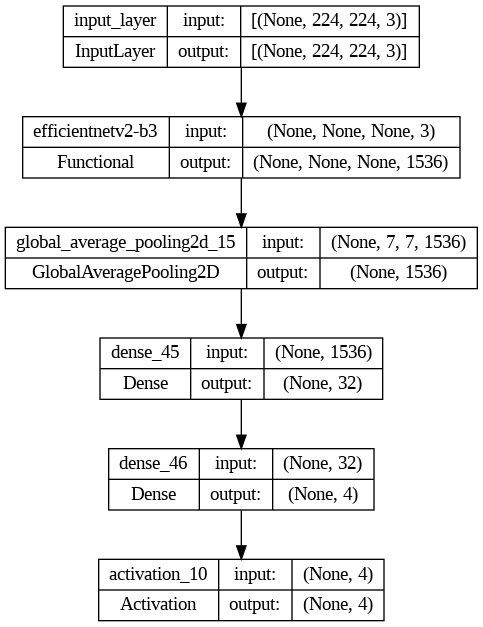

In [185]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [186]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [187]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
60/60 [==============================] - 28s 276ms/step - loss: 0.6813 - accuracy: 0.7304 - val_loss: 0.3913 - val_accuracy: 0.8660 - lr: 0.0010
Epoch 2/20
60/60 [==============================] - 12s 197ms/step - loss: 0.4439 - accuracy: 0.8324 - val_loss: 0.3212 - val_accuracy: 0.8804 - lr: 0.0010
Epoch 3/20
60/60 [==============================] - 12s 199ms/step - loss: 0.4021 - accuracy: 0.8516 - val_loss: 0.2791 - val_accuracy: 0.9043 - lr: 0.0010
Epoch 4/20
60/60 [==============================] - 12s 196ms/step - loss: 0.3667 - accuracy: 0.8627 - val_loss: 0.2486 - val_accuracy: 0.9203 - lr: 0.0010
Epoch 5/20
60/60 [==============================] - 12s 196ms/step - loss: 0.3396 - accuracy: 0.8737 - val_loss: 0.2386 - val_accuracy: 0.9187 - lr: 0.0010
Epoch 6/20
60/60 [==============================] - 12s 195ms/step - loss: 0.3214 - accuracy: 0.8814 - val_loss: 0.2348 - val_accuracy: 0.9139 - lr: 0.0010
Epoch 7/20
60/60 [==============================] - 12s 194ms/st

EfficientNetV2B3 Evaluation

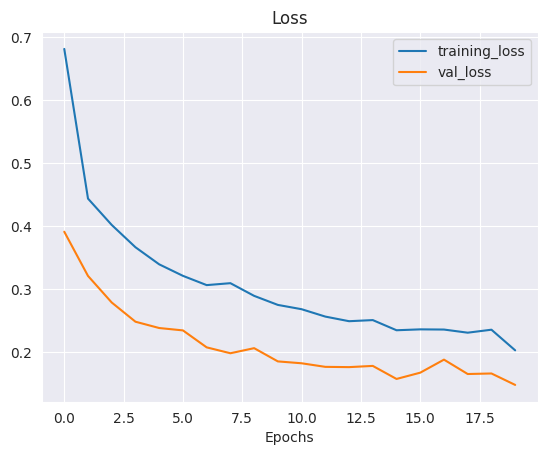

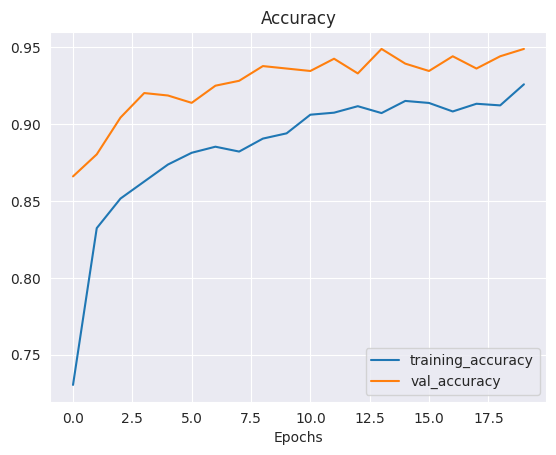

In [188]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 155ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       105
           1       0.98      0.99      0.99       111
           2       0.93      0.84      0.89       102
           3       0.88      0.93      0.90       108

    accuracy                           0.94       426
   macro avg       0.94      0.94      0.94       426
weighted avg       0.94      0.94      0.94       426

Specificity: [0.3188854489164087, 0.34810126582278483, 0.2529411764705882, 0.3067484662576687]
Mean Squared Error: : 0.10587150603532791
The average AUC-ROC is 0.9908204960533096


[0.9936908517350158,
 0.6656050955414012,
 0.688622754491018,
 0.6677316293929713,
 0.6498422712933754,
 0.9968152866242038,
 0.6676646706586826,
 0.6485623003194888,
 0.6908517350157729,
 0.678343949044586,
 0.9520958083832335,
 0.7092651757188498,
 0.6656151419558359,
 0.6592356687898089,
 0.6916167664670658,
 0.9744408945686901]

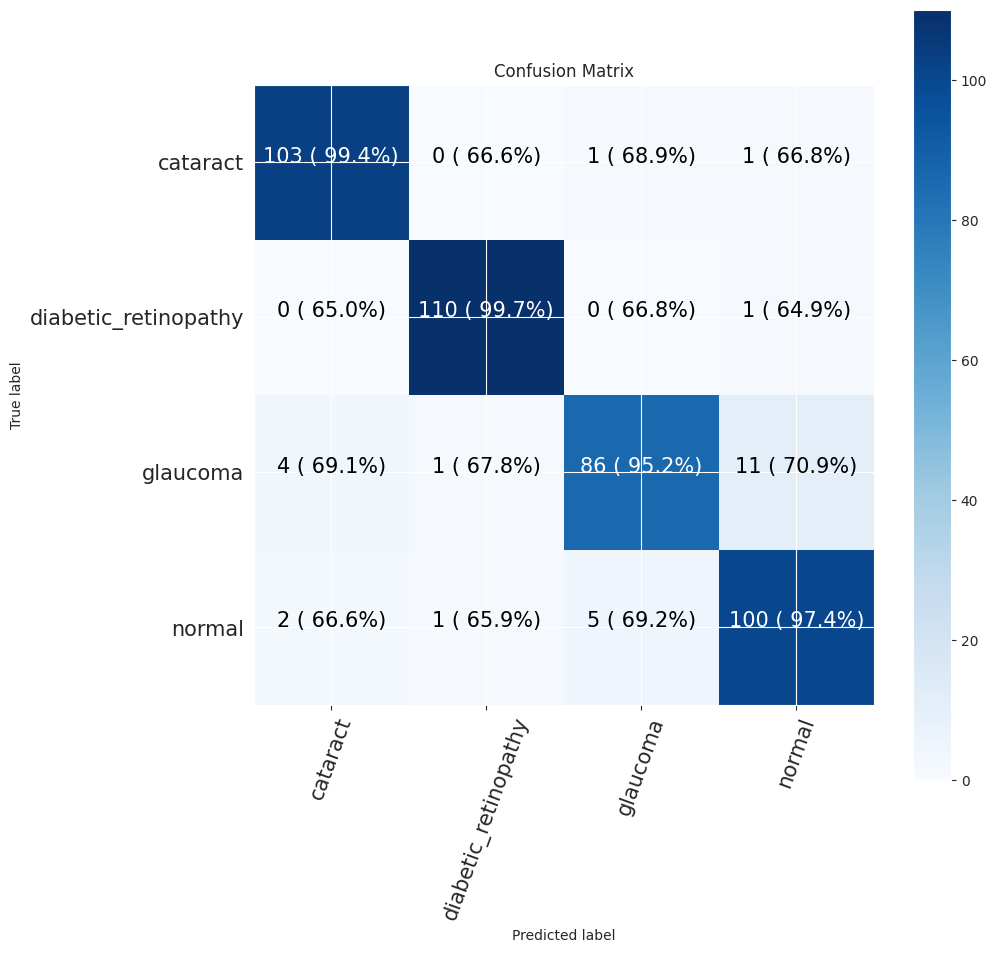

In [189]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


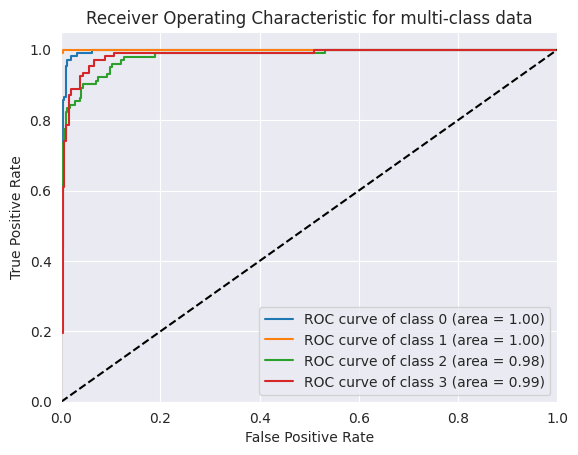

In [190]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [191]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# # Freeze the layers in the base model
# for layer in cnn_model.layers:
#     layer.trainable = False

# rbg = layers.Input(shape=(224, 224, 3))

# rbg = data_aug(rbg)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes


# Display model summary
cnn_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_25 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_20 (MaxPooli  (None, 111, 111, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_26 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_21 (MaxPooli  (None, 54, 54, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_27 (Conv2D)          (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_22 (MaxPooli  (None, 26, 26, 128)      

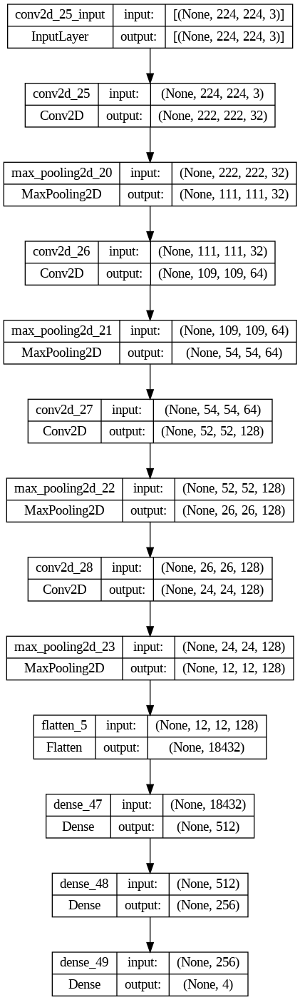

In [192]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [193]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [194]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
60/60 [==============================] - 9s 118ms/step - loss: 2.5443 - accuracy: 0.5548 - val_loss: 0.3120 - val_accuracy: 0.7368 - lr: 0.0010
Epoch 2/20
60/60 [==============================] - 6s 100ms/step - loss: 0.2981 - accuracy: 0.7275 - val_loss: 0.2658 - val_accuracy: 0.7544 - lr: 0.0010
Epoch 3/20
60/60 [==============================] - 6s 100ms/step - loss: 0.2446 - accuracy: 0.7799 - val_loss: 0.2466 - val_accuracy: 0.7959 - lr: 0.0010
Epoch 4/20
60/60 [==============================] - 6s 100ms/step - loss: 0.2210 - accuracy: 0.8115 - val_loss: 0.2076 - val_accuracy: 0.8102 - lr: 0.0010
Epoch 5/20
60/60 [==============================] - 6s 100ms/step - loss: 0.2038 - accuracy: 0.8234 - val_loss: 0.1929 - val_accuracy: 0.8389 - lr: 0.0010
Epoch 6/20
60/60 [==============================] - 6s 100ms/step - loss: 0.2148 - accuracy: 0.8231 - val_loss: 0.2233 - val_accuracy: 0.7990 - lr: 0.0010
Epoch 7/20
60/60 [==============================] - 6s 99ms/step - los

CNN Evaluation

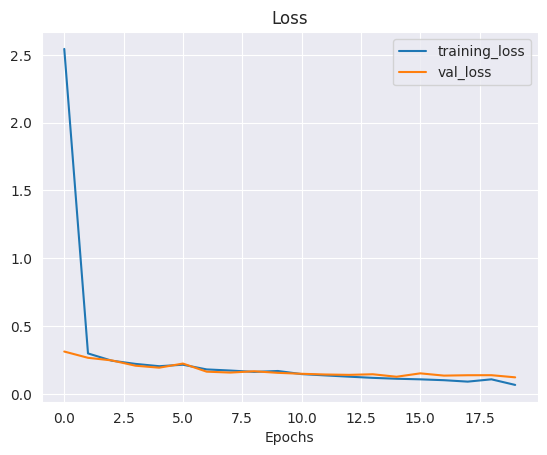

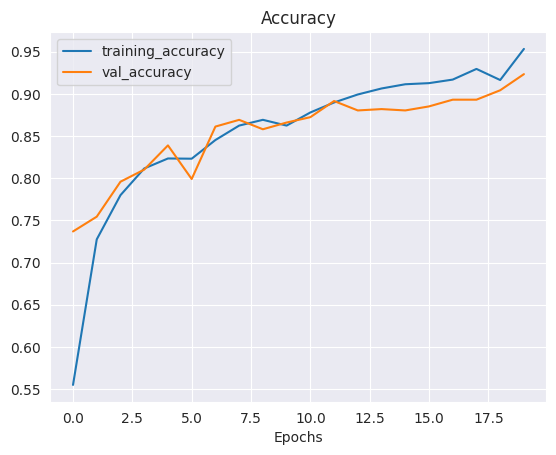

In [195]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 32ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.82      0.84       105
           1       1.00      0.99      1.00       111
           2       0.75      0.80      0.78       102
           3       0.81      0.81      0.81       108

    accuracy                           0.86       426
   macro avg       0.86      0.85      0.86       426
weighted avg       0.86      0.86      0.86       426

Specificity: [0.2529411764705882, 0.34810126582278483, 0.23837209302325582, 0.25663716814159293]
Mean Squared Error: : 0.11394379287958145
The average AUC-ROC is 0.9562466480419505


[0.9418960244648318,
 0.6677215189873418,
 0.7034700315457413,
 0.6949685534591195,
 0.6605504587155964,
 0.9968354430379747,
 0.6529968454258676,
 0.6509433962264151,
 0.709480122324159,
 0.6772151898734177,
 0.9369085173501577,
 0.720125786163522,
 0.6880733944954128,
 0.6582278481012658,
 0.7066246056782335,
 0.9339622641509434]

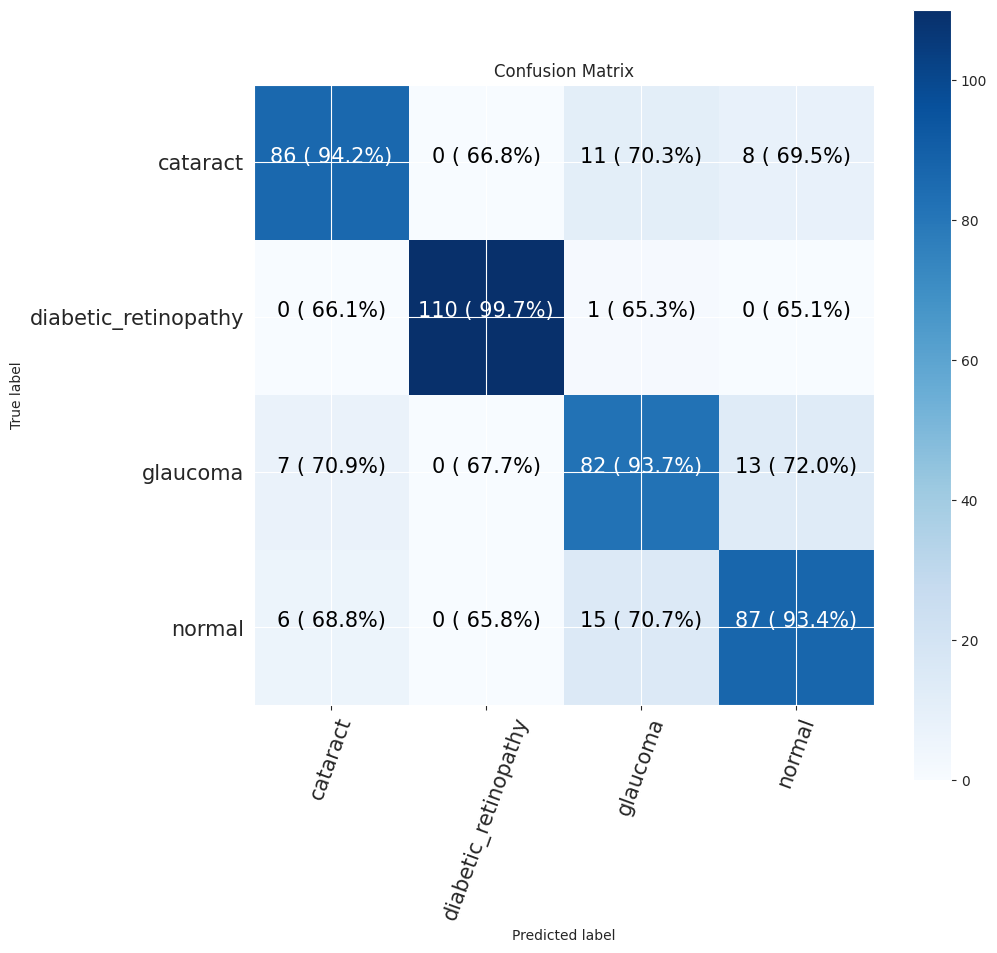

In [196]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


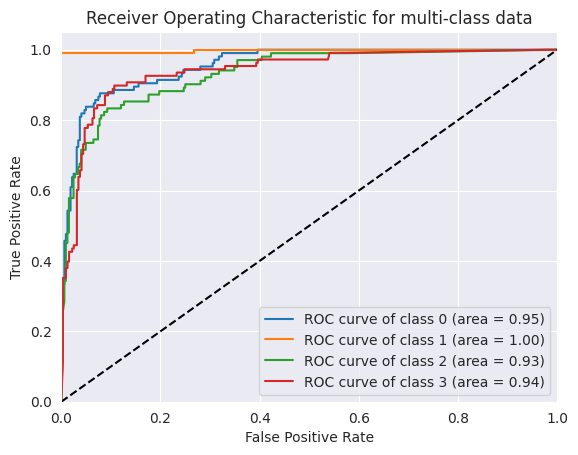

In [197]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [198]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [199]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

input = layers.Input(shape=(224, 224, 3))

conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


Model: "model_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_23 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_29 (Conv2D)          (None, 224, 224, 3)       84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
 6 (GlobalAveragePooling2D)                                      
                                                                 
 dense_50 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_51 (Dense)            (None, 4)                 4100      
                                                          

In [200]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

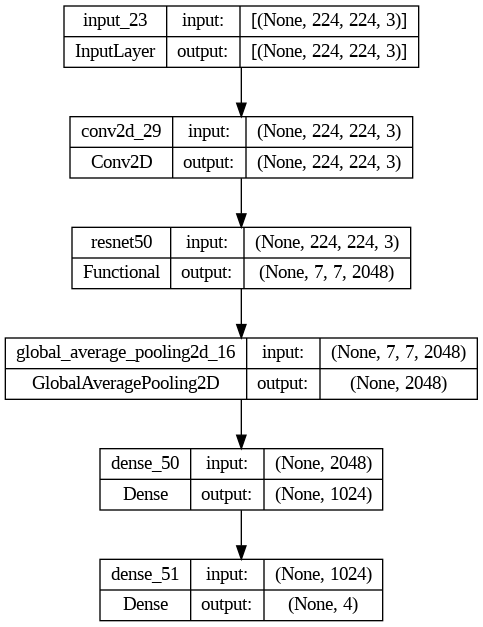

In [201]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [202]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [203]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
60/60 [==============================] - 39s 582ms/step - loss: 0.3397 - accuracy: 0.7470 - val_loss: 0.1806 - val_accuracy: 0.8581 - lr: 0.0010
Epoch 2/20
60/60 [==============================] - 31s 513ms/step - loss: 0.1831 - accuracy: 0.8569 - val_loss: 0.1377 - val_accuracy: 0.9011 - lr: 0.0010
Epoch 3/20
60/60 [==============================] - 31s 512ms/step - loss: 0.1495 - accuracy: 0.8830 - val_loss: 0.1263 - val_accuracy: 0.9123 - lr: 0.0010
Epoch 4/20
60/60 [==============================] - 31s 512ms/step - loss: 0.1294 - accuracy: 0.9014 - val_loss: 0.1043 - val_accuracy: 0.9219 - lr: 0.0010
Epoch 5/20
60/60 [==============================] - 31s 513ms/step - loss: 0.1210 - accuracy: 0.9104 - val_loss: 0.1138 - val_accuracy: 0.9187 - lr: 0.0010
Epoch 6/20
60/60 [==============================] - 31s 513ms/step - loss: 0.1085 - accuracy: 0.9146 - val_loss: 0.0889 - val_accuracy: 0.9330 - lr: 0.0010
Epoch 7/20
60/60 [==============================] - 31s 513ms/st

ResNet50 Evaluation

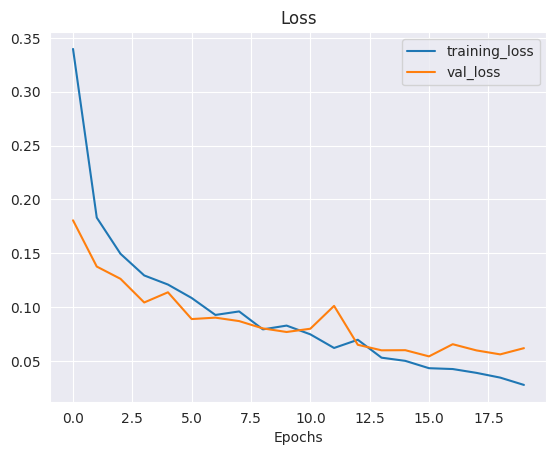

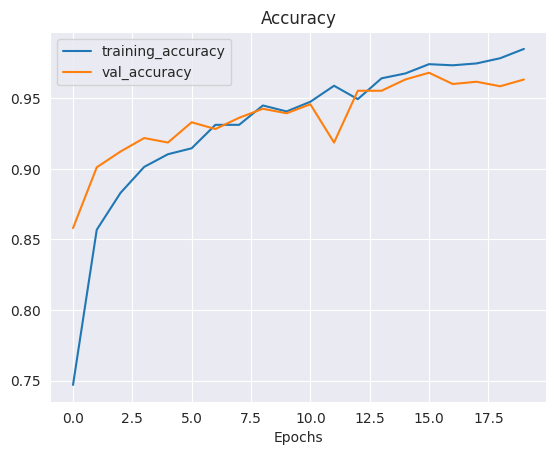

In [204]:
plot_loss_curves(resnet50_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 185ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       105
           1       1.00      0.99      1.00       111
           2       0.77      0.92      0.84       102
           3       0.94      0.78      0.85       108

    accuracy                           0.91       426
   macro avg       0.92      0.91      0.91       426
weighted avg       0.92      0.91      0.91       426

Specificity: [0.3067484662576687, 0.34810126582278483, 0.28313253012048195, 0.24561403508771928]
Mean Squared Error: : 0.10568500310182571
The average AUC-ROC is 0.9869423714202807


[0.9844236760124611,
 0.6677215189873418,
 0.6710526315789473,
 0.6884272997032641,
 0.6542056074766355,
 0.9968354430379747,
 0.6381578947368421,
 0.6706231454005934,
 0.6915887850467289,
 0.6772151898734177,
 0.9736842105263158,
 0.712166172106825,
 0.6697819314641744,
 0.6582278481012658,
 0.7171052631578947,
 0.9287833827893175]

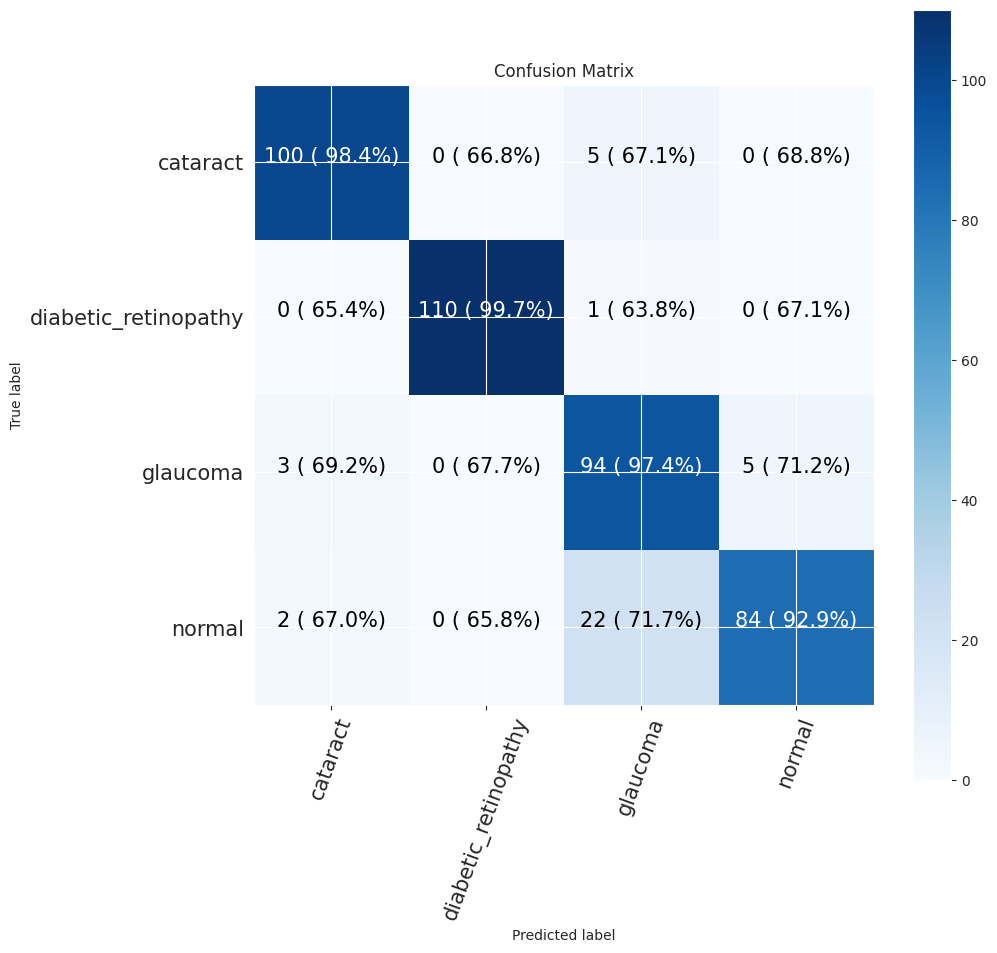

In [205]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


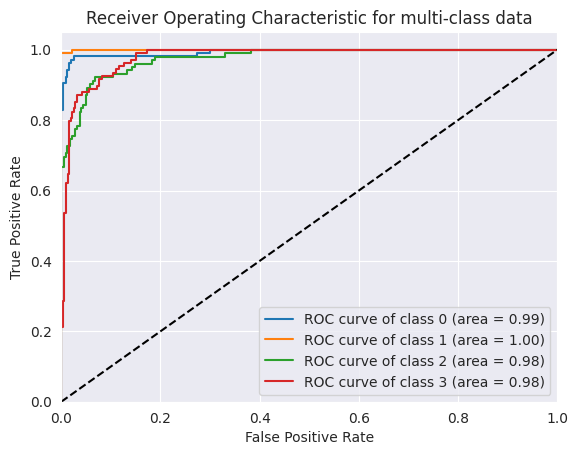

In [206]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [207]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [208]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



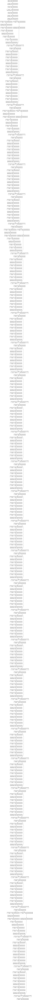

In [209]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [210]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
# x = data_aug(inputs)
x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
 7 (GlobalAveragePooling2D)                                      
                                                                 
 dense_52 (Dense)            (None, 32)                65568     
                                                                 
 dense_53 (Dense)            (None, 4)                 132       
                                                                 
 activation_11 (Activation)  (None, 4)                 0  

In [211]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [212]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
60/60 [==============================] - 30s 393ms/step - loss: 0.6540 - accuracy: 0.7314 - val_loss: 0.4121 - val_accuracy: 0.8437 - lr: 0.0010
Epoch 2/20
60/60 [==============================] - 23s 372ms/step - loss: 0.4019 - accuracy: 0.8482 - val_loss: 0.3385 - val_accuracy: 0.8756 - lr: 0.0010
Epoch 3/20
60/60 [==============================] - 22s 362ms/step - loss: 0.3460 - accuracy: 0.8711 - val_loss: 0.2724 - val_accuracy: 0.9043 - lr: 0.0010
Epoch 4/20
60/60 [==============================] - 22s 358ms/step - loss: 0.2958 - accuracy: 0.8896 - val_loss: 0.2917 - val_accuracy: 0.8884 - lr: 0.0010
Epoch 5/20
60/60 [==============================] - 22s 358ms/step - loss: 0.2670 - accuracy: 0.8980 - val_loss: 0.2264 - val_accuracy: 0.9059 - lr: 0.0010
Epoch 6/20
60/60 [==============================] - 22s 362ms/step - loss: 0.2349 - accuracy: 0.9096 - val_loss: 0.2265 - val_accuracy: 0.9107 - lr: 0.0010
Epoch 7/20
60/60 [==============================] - 22s 361ms/st

ResNet50 Evaluation

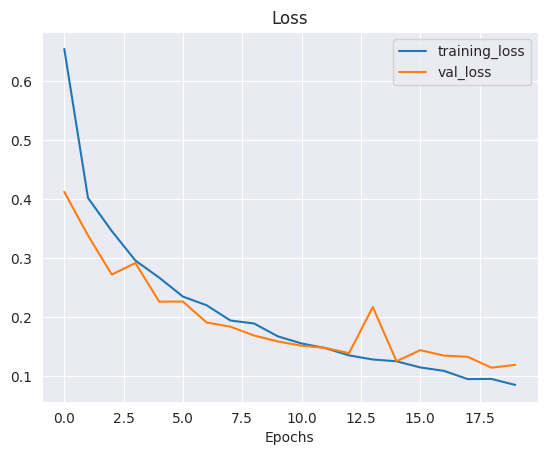

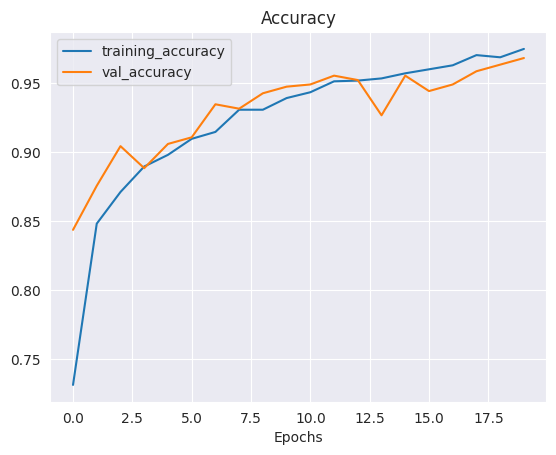

In [213]:
plot_loss_curves(resnet101_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 2s 303ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       105
           1       0.97      0.99      0.98       111
           2       0.85      0.90      0.88       102
           3       0.92      0.81      0.86       108

    accuracy                           0.92       426
   macro avg       0.92      0.92      0.92       426
weighted avg       0.92      0.92      0.92       426

Specificity: [0.3188854489164087, 0.34810126582278483, 0.2754491017964072, 0.2603550295857988]
Mean Squared Error: : 0.10649473965167999
The average AUC-ROC is 0.9899950165143276


[0.9936908517350158,
 0.6645367412140575,
 0.6761006289308176,
 0.6818181818181818,
 0.6498422712933754,
 0.9968051118210862,
 0.6509433962264151,
 0.6666666666666666,
 0.6845425867507886,
 0.6773162939297125,
 0.9685534591194969,
 0.7121212121212122,
 0.6719242902208202,
 0.6613418530351438,
 0.7044025157232704,
 0.9393939393939394]

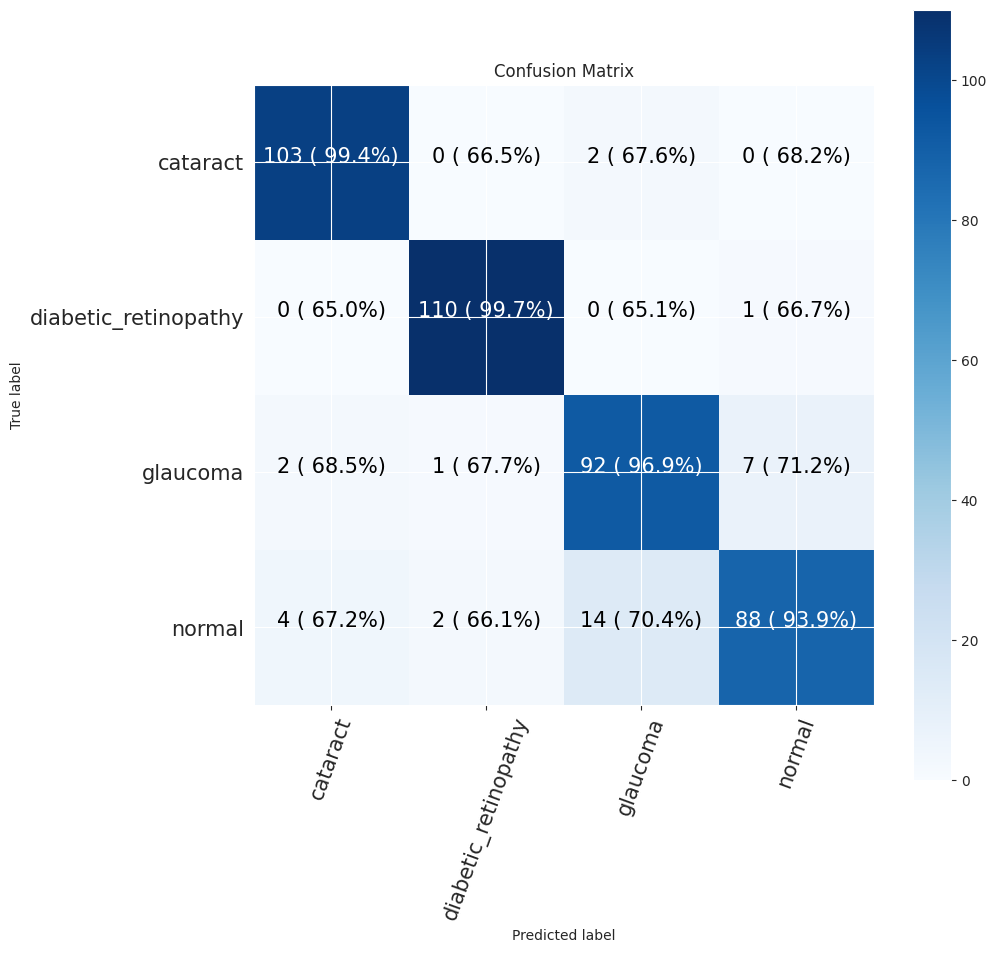

In [214]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


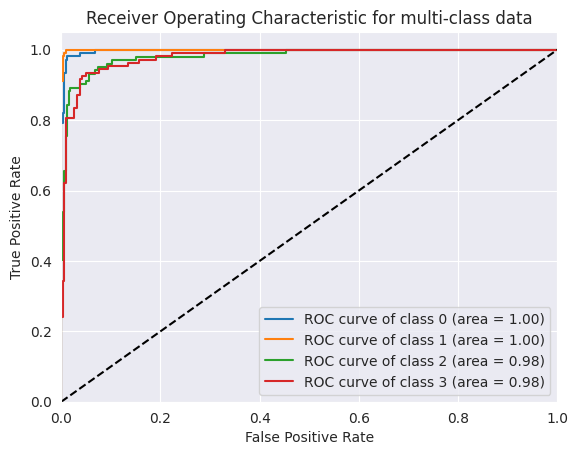

In [215]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()